In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os
import seaborn as sns
import sys
import glob
import tqdm
plt.style.use('default')
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({'font.size': 22, 'legend.facecolor': 'white', 'legend.framealpha': 1, "legend.frameon": 1, "lines.linewidth": 2})

In [2]:
label_df = pd.read_csv("/extdata4/baeklab/Hyeonseo/m6A/runs/exp_MRNA/ON0090/ON0090/label/Baeklab.070.GP3.depth5_None.twm6astrict.tsv", sep="\t")
label_df = label_df[["id", "depth", "label", "m6A_level", "5mer", "drach"]]
label_df.rename(columns = {"id": "label_id","m6A_level": "dom_label"}, inplace = True)
label_df.reset_index(inplace=True)
label_df["index"] = label_df.index.astype(np.int32)
label_df_filtered = label_df[((label_df["dom_label"] > 0.0) & (label_df["label"] == 1)) | (label_df["label"] == 0)]
print(label_df_filtered)
print(label_df_filtered["label"].value_counts())

             index        label_id  depth  label  dom_label   5mer  drach
0                0    NM_000084:34      7      0        0.0  GCAGA  False
1                1    NM_000084:36      7      0        0.0  AGAGA  False
2                2    NM_000084:38      7      0        0.0  AGAAT  False
3                3    NM_000084:39      7      0        0.0  GAATG  False
4                4    NM_000084:43      7      0        0.0  GCAGC  False
...            ...             ...    ...    ...        ...    ...    ...
30960221  30960221  NR_176252:1213     37      0        0.0  TTACT  False
30960222  30960222  NR_176252:1218     36      0        0.0  TTAAA  False
30960223  30960223  NR_176252:1219     36      0        0.0  TAAAA  False
30960224  30960224  NR_176252:1220     36      0        0.0  AAAAT  False
30960225  30960225  NR_176252:1221     36      0        0.0  AAATG  False

[18499997 rows x 7 columns]
label
0    18399879
1      100118
Name: count, dtype: int64


In [3]:
label_alt = pd.read_csv("/extdata4/baeklab/Hyeonseo/m6A/runs/exp_MRNA/ON0090/ON0090/result/label/GLORIPUB.GP3.depth5_None.twm6astrict.tsv", sep="\t")
label_alt = label_alt[["id", "depth", "label", "m6A_level", "5mer", "drach"]]
label_alt.rename(columns = {"id": "label_id","m6A_level": "dom_label"}, inplace = True)
label_alt.reset_index(inplace=True)
label_alt["index"] = label_alt.index.astype(np.int32)
label_alt_filtered = label_alt[((label_alt["dom_label"] > 0.0) & (label_alt["label"] == 1)) | (label_alt["label"] == 0)]
print(label_alt_filtered)
print(label_alt_filtered["label"].value_counts())

             index        label_id  depth  label  dom_label   5mer  drach
362            362    NM_000986:32   8001      0        0.0  GGAGC  False
364            364    NM_000986:45   8014      0        0.0  TGAAG  False
365            365    NM_000986:46   8015      0        0.0  GAAGG  False
367            367    NM_000986:60   8027      0        0.0  GCAGT  False
369            369    NM_000986:73   8033      0        0.0  GTACA  False
...            ...             ...    ...    ...        ...    ...    ...
30959767  30959767  NR_182068:1325      6      0        0.0  ATAAA  False
30959768  30959768  NR_182068:1326      6      0        0.0  TAAAG  False
30959769  30959769  NR_182068:1327      6      0        0.0  AAAGC  False
30959770  30959770  NR_182068:1334      6      0        0.0  GTACC  False
30959771  30959771  NR_182068:1337      6      0        0.0  CCATG  False

[17310037 rows x 7 columns]
label
0    17226003
1       84034
Name: count, dtype: int64


In [4]:
dorado_alt = pd.read_pickle("/extdata4/baeklab/Hyeonseo/m6A/runs/exp_MRNA/ON0090/ON0090/result/dorado-070-aligned/intermediates/dorado_output.pkl")
dorado_alt = dorado_alt[dorado_alt["dorado_count"] >= 20]
dorado_alt = dorado_alt[["pred_dorado", "dorado_count", "label_id"]]
print(dorado_alt)

          pred_dorado  dorado_count       label_id
413            0.5250            40    NM_000016:0
414            0.0164            61    NM_000016:2
415            0.0822            73    NM_000016:5
417            0.0250           160   NM_000016:21
418            0.0710           155   NM_000016:24
...               ...           ...            ...
59475965       0.1795            39  NR_184306:326
59475966       0.0488            41  NR_184306:330
59475967       0.0000            40  NR_184306:331
59475968       0.0000            41  NR_184306:333
59475969       0.0000            24  NR_184306:334

[15457254 rows x 3 columns]


In [97]:
dorado_8 = pd.read_pickle("/extdata4/baeklab/Hyeonseo/m6A/dorado-080/ON0090_dorado_basecall.bed.m6A.pkl")
print(dorado_8)

                label_id  dom  count_dom
0            NM_000015:0  0.0          1
1            NM_000015:5  0.0          2
2            NM_000015:8  0.5          2
3           NM_000015:10  0.0          1
4           NM_000015:12  0.0          1
...                  ...  ...        ...
59327550  NR_184563:6992  0.0          1
59327551  NR_184563:6999  0.0          1
59327552  NR_184563:7000  1.0          1
59327553  NR_184563:7002  0.0          1
59327554  NR_184563:7005  0.0          1

[59327555 rows x 3 columns]


In [98]:
dorado_8.rename(columns = {"dom": "pred_dorado", "count_dom": "dorado_count"}, inplace = True)
dorado_8 = dorado_8[dorado_8["dorado_count"] >= 20]
dorado_8 = dorado_8[["pred_dorado", "dorado_count", "label_id"]]
print(dorado_8)

          pred_dorado  dorado_count       label_id
415            0.3429            35    NM_000016:0
416            0.0161            62    NM_000016:2
417            0.0149            67    NM_000016:5
419            0.0125           160   NM_000016:21
420            0.0616           146   NM_000016:24
...               ...           ...            ...
59324323       0.1463            41  NR_184306:326
59324324       0.0000            40  NR_184306:330
59324325       0.0233            43  NR_184306:331
59324326       0.0000            43  NR_184306:333
59324327       0.0938            32  NR_184306:334

[15399056 rows x 3 columns]


In [99]:
dorado_8.rename(columns = {"pred_dorado": "pred_dorado8", "dorado_count": "dorado8_count"}, inplace = True)

In [5]:
logsum_alt = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v4-20240905-092858-10-177000-token_normalise_dwell_bq_npz_allmotif_pileup_psum/pileup.npz"
with np.load(logsum_alt, allow_pickle=True) as data:
    logsum_alt = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_alt = logsum_alt[logsum_alt["count_all"] >= 20]
print(logsum_alt)

                label_id      p_sum  logsum_p_pos  logsum_1_p_pos  count_pos  \
0         NM_000016:1000   0.606511      0.000000        0.000000          0   
1         NM_000016:1008   0.948786      0.000000        0.000000          0   
2         NM_000016:1009   2.607620      0.000000        0.000000          0   
3         NM_000016:1010   4.912612      0.000000        0.000000          0   
4         NM_000016:1014   3.237954      0.000000        0.000000          0   
...                  ...        ...           ...             ...        ...   
30894417    NR_184306:85   1.133184      0.000000        0.000000          0   
30894420    NR_184306:87   3.771550     -0.001452       -2.476578          1   
30894423    NR_184306:88   2.137289      0.000000        0.000000          0   
30894435    NR_184306:93  32.341377     -0.011076      -78.301079         23   
30894446    NR_184306:98   4.046034      0.000000        0.000000          0   

          logsum_p_neg  logsum_1_p_neg 

In [7]:
m6anet_df = pd.read_csv("/extdata4/baeklab/Hyeonseo/m6A/m6anet/ON0090/out/data.site_proba.csv")
m6anet_df["id"] = m6anet_df["transcript_id"].str.split(".").str[0]
m6anet_df["id"] = m6anet_df["id"] + ":" + m6anet_df["transcript_position"].astype(str)
m6anet_df.rename(columns = {"id": "label_id", "probability_modified": "pred_m6anet", "mod_ratio": "dom_m6anet"}, inplace = True)
m6anet_df = m6anet_df[["label_id", "pred_m6anet", "dom_m6anet"]]
print(m6anet_df)

             label_id  pred_m6anet  dom_m6anet
0        NM_000017:44     0.944216    0.851852
1       NM_000017:158     0.718827    0.458333
2       NM_000017:168     0.112776    0.056075
3       NM_000017:189     0.127073    0.032258
4       NM_000017:199     0.910825    0.764706
...               ...          ...         ...
474111   NR_184306:93     0.980678    0.794872
474112  NR_184306:174     0.481733    0.142857
474113  NR_184306:231     0.158632    0.075000
474114  NR_184306:305     0.175728    0.069767
474115  NR_184306:312     0.037475    0.022222

[474116 rows x 3 columns]


In [8]:

logsum_alt = logsum_alt.merge(dorado_alt, on="label_id", how="outer")
logsum_alt = logsum_alt.merge(m6anet_df, on="label_id", how="outer")
print(logsum_alt)

                label_id     p_sum  logsum_p_pos  logsum_1_p_pos  count_pos  \
0         NM_000016:1000  0.606511           0.0             0.0        0.0   
1         NM_000016:1008  0.948786           0.0             0.0        0.0   
2         NM_000016:1009  2.607620           0.0             0.0        0.0   
3         NM_000016:1010  4.912612           0.0             0.0        0.0   
4         NM_000016:1014  3.237954           0.0             0.0        0.0   
...                  ...       ...           ...             ...        ...   
16573252   NR_168401:142       NaN           NaN             NaN        NaN   
16573253   NR_168401:259       NaN           NaN             NaN        NaN   
16573254  NR_168501:2908       NaN           NaN             NaN        NaN   
16573255  NR_169525:1544       NaN           NaN             NaN        NaN   
16573256  NR_169525:1709       NaN           NaN             NaN        NaN   

          logsum_p_neg  logsum_1_p_neg  count_neg  

In [9]:
logsum_alt = logsum_alt.fillna(0)
logsum_alt["pm6a"] =  -(2-logsum_alt["dom"])*logsum_alt["logsum_1_p_pos"]/logsum_alt["count_all"] + ((1-logsum_alt["dom"])*np.log10(np.clip(1-logsum_alt["dom"],1e-30,1)) + logsum_alt["dom"] * np.log10(np.clip(logsum_alt["dom"],1e-30,1)))*(logsum_alt["count_pos"]/logsum_alt["count_all"])

In [10]:
label_glori = label_df[["label_id", "dom_label"]].copy()
label_glori.rename({"dom_label": "dom_alt"}, axis=1, inplace=True)
logsum_alt = logsum_alt[[ "label_id", "pm6a", "dom", "count_all", "count_dom", "pred_dorado", "dorado_count","pred_m6anet", "dom_m6anet"]].copy()
logsum_alt = logsum_alt.merge(label_alt_filtered, on="label_id", how="inner")
logsum_alt = logsum_alt.merge(label_glori, on="label_id", how="inner")
logsum_alt["ambiguous"] = ((logsum_alt["dom_alt"] > 0) & (logsum_alt["dom_label"] == 0))|(logsum_alt["dom_alt"] == 0) & (logsum_alt["dom_label"] > 0)
print(logsum_alt)

                label_id  pm6a       dom  count_all  count_dom  pred_dorado  \
0         NM_000016:1000   0.0  0.000000      258.0      258.0       0.0000   
1         NM_000016:1008   0.0  0.000000      257.0      256.0       0.0000   
2         NM_000016:1009  -0.0  0.003891      260.0      257.0       0.0000   
3         NM_000016:1010  -0.0  0.011583      263.0      259.0       0.0077   
4         NM_000016:1014   0.0  0.000000      258.0      252.0       0.0040   
...                  ...   ...       ...        ...        ...          ...   
10361914  NM_173793:3715   NaN  0.000000        0.0        0.0       0.0000   
10361915  NM_178537:2689   NaN  0.000000        0.0        0.0       0.0000   
10361916   NM_206967:906   NaN  0.000000        0.0        0.0       0.0000   
10361917  NR_034146:1986   NaN  0.000000        0.0        0.0       0.0000   
10361918   NR_161454:884   NaN  0.000000        0.0        0.0       0.0000   

          dorado_count  pred_m6anet  dom_m6anet    

In [88]:
logsum_alt_nd = "/extdata4/baeklab/Hyeonseo/m6A/inference/pileup/AIRNA-DW-v4-m6A-20241107-154905-23-340000-token_normalise_ver161024_ON0090_m6Afinal/pileup_strid.npz"
with np.load(logsum_alt_nd, allow_pickle=True) as data:
    logsum_alt_nd = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_alt_nd = logsum_alt_nd[logsum_alt_nd["count_all"] >= 20]
print(logsum_alt_nd)

                 label_id      pm6a       dom  count_all  count_pos  \
1             NM_024682:0  0.000000  0.000000         36          0   
6             NM_198573:2  0.265128  0.080257         35          2   
7             NM_004134:2  0.000000  0.000000        132          0   
10            NM_139279:2  0.000000  0.000000         25          0   
13            NM_004586:2  0.000000  0.000000         39          0   
...                   ...       ...       ...        ...        ...   
33284064  NR_002728:65819  0.000000  0.000000        112          0   
33284065  NR_002728:65820  0.000000  0.000000        109          0   
33284066  NR_002728:65821  0.000000  0.000000        101          0   
33284067  NR_002728:65822  0.000000  0.000000         87          0   
33284068  NR_002728:65823  0.000000  0.000000         74          0   

          kl_div_neg  kl_div_pos  logsum_1_p_pos  
1          34.140289     0.00000        0.000000  
6          26.391901     2.30297       -4.960

In [89]:
logsum_alt_nd = logsum_alt_nd.merge(dorado_alt, on="label_id", how="outer")
logsum_alt_nd = logsum_alt_nd.merge(m6anet_df, on="label_id", how="outer")
print(logsum_alt_nd)

                label_id      pm6a       dom  count_all  count_pos  \
0            NM_024682:0  0.000000  0.000000       36.0        0.0   
1            NM_198573:2  0.265128  0.080257       35.0        2.0   
2            NM_004134:2  0.000000  0.000000      132.0        0.0   
3            NM_139279:2  0.000000  0.000000       25.0        0.0   
4            NM_004586:2  0.000000  0.000000       39.0        0.0   
...                  ...       ...       ...        ...        ...   
16573416   NR_168401:142       NaN       NaN        NaN        NaN   
16573417   NR_168401:259       NaN       NaN        NaN        NaN   
16573418  NR_168501:2908       NaN       NaN        NaN        NaN   
16573419  NR_169525:1544       NaN       NaN        NaN        NaN   
16573420  NR_169525:1709       NaN       NaN        NaN        NaN   

          kl_div_neg  kl_div_pos  logsum_1_p_pos  pred_dorado  dorado_count  \
0          34.140289     0.00000        0.000000       0.0000          41.0   
1

In [90]:
logsum_alt_nd = logsum_alt_nd.fillna(0)
logsum_alt_nd = logsum_alt_nd.merge(label_alt_filtered, on="label_id", how="inner")
logsum_alt_nd = logsum_alt_nd.merge(label_glori, on="label_id", how="inner")
logsum_alt_nd["ambiguous"] = ((logsum_alt_nd["dom_alt"] > 0) & (logsum_alt_nd["dom_label"] == 0))|(logsum_alt_nd["dom_alt"] == 0) & (logsum_alt_nd["dom_label"] > 0)
print(logsum_alt_nd)

                label_id      pm6a       dom  count_all  count_pos  \
0            NM_198573:2  0.265128  0.080257       35.0        2.0   
1            NM_004134:2  0.000000  0.000000      132.0        0.0   
2            NM_004586:2  0.000000  0.000000       39.0        0.0   
3            NM_000581:2 -0.000000  0.003271       45.0        0.0   
4            NM_019102:2 -0.000000  0.014101      113.0        0.0   
...                  ...       ...       ...        ...        ...   
10362028  NM_173793:3715  0.000000  0.000000        0.0        0.0   
10362029  NM_178537:2689  0.000000  0.000000        0.0        0.0   
10362030   NM_206967:906  0.000000  0.000000        0.0        0.0   
10362031  NR_034146:1986  0.000000  0.000000        0.0        0.0   
10362032   NR_161454:884  0.000000  0.000000        0.0        0.0   

          kl_div_neg  kl_div_pos  logsum_1_p_pos  pred_dorado  dorado_count  \
0          26.391901    2.302970       -4.960128       0.0000          35.0   
1

In [100]:
logsum_alt_nd = logsum_alt_nd.merge(dorado_8, on="label_id", how="inner")
print(logsum_alt_nd)

               label_id      pm6a       dom  count_all  count_pos  kl_div_neg  \
0           NM_198573:2  0.265128  0.080257       35.0        2.0   26.391901   
1           NM_004134:2  0.000000  0.000000      132.0        0.0  130.395538   
2           NM_004586:2  0.000000  0.000000       39.0        0.0   38.581524   
3           NM_000581:2 -0.000000  0.003271       45.0        0.0   42.265316   
4           NM_019102:2 -0.000000  0.014101      113.0        0.0  100.920410   
...                 ...       ...       ...        ...        ...         ...   
9505066  NM_133264:6041  0.000000  0.000000        0.0        0.0    0.000000   
9505067  NM_145018:3517  0.000000  0.000000        0.0        0.0    0.000000   
9505068  NM_153358:2145  0.000000  0.000000        0.0        0.0    0.000000   
9505069  NM_173793:3715  0.000000  0.000000        0.0        0.0    0.000000   
9505070  NR_034146:1986  0.000000  0.000000        0.0        0.0    0.000000   

         kl_div_pos  logsum

In [67]:
from sklearn.metrics import precision_recall_curve, auc, roc_curve

plt.style.use('default')
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({'font.size': 28, 'legend.facecolor': 'white', 'legend.framealpha': 1, "legend.frameon": 1, "lines.linewidth": 10})
plt.rcParams.update({"axes.prop_cycle": plt.cycler("color", ["royalblue", "tomato", "forestgreen", "darkgoldenrod", "darkorchid"])})

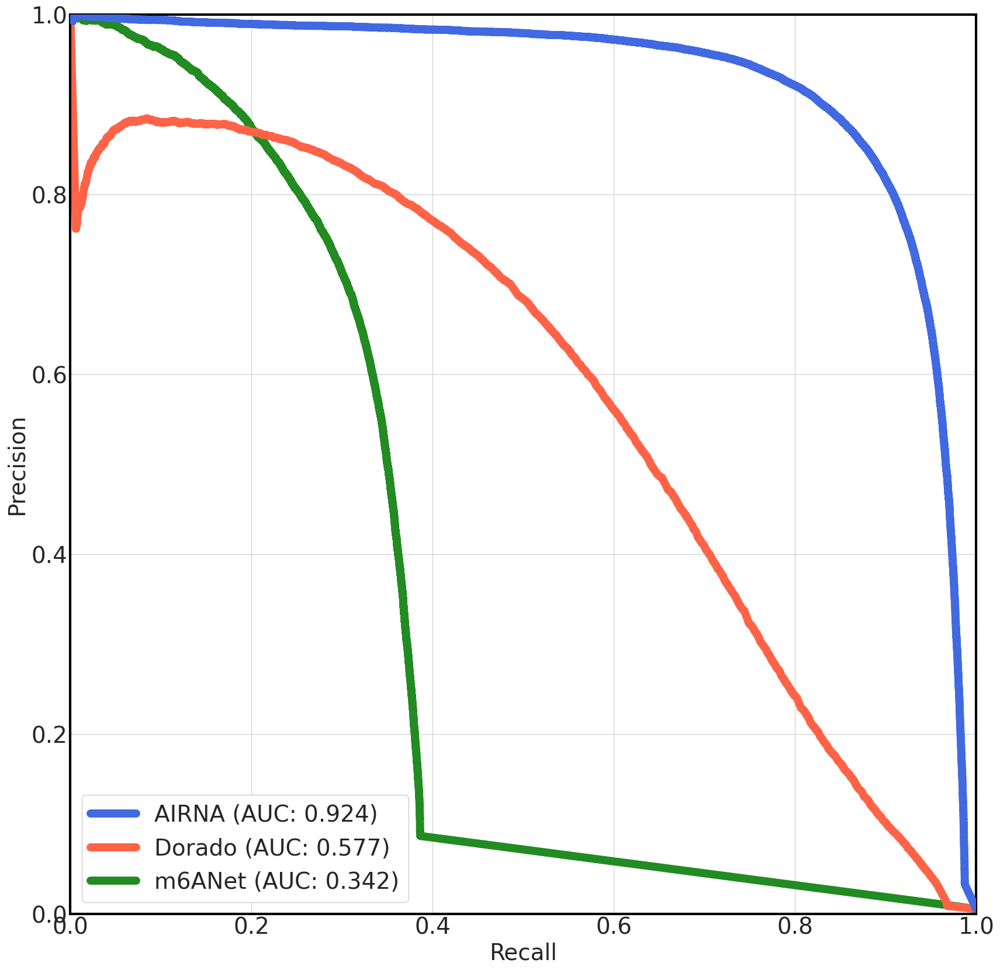

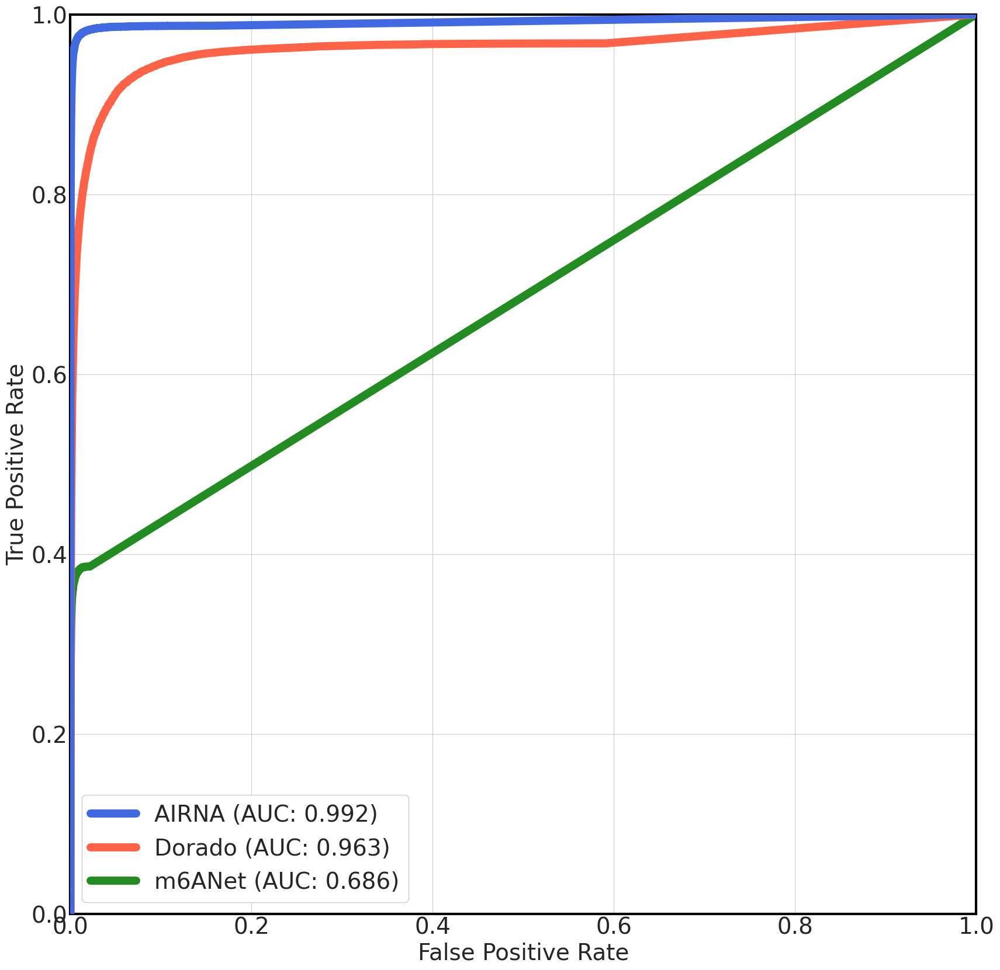

In [12]:


selected_df = logsum_alt[(logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)

## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/allcontext_pr.pdf", format="pdf")
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/allcontext_roc.pdf", format="pdf")
plt.show()


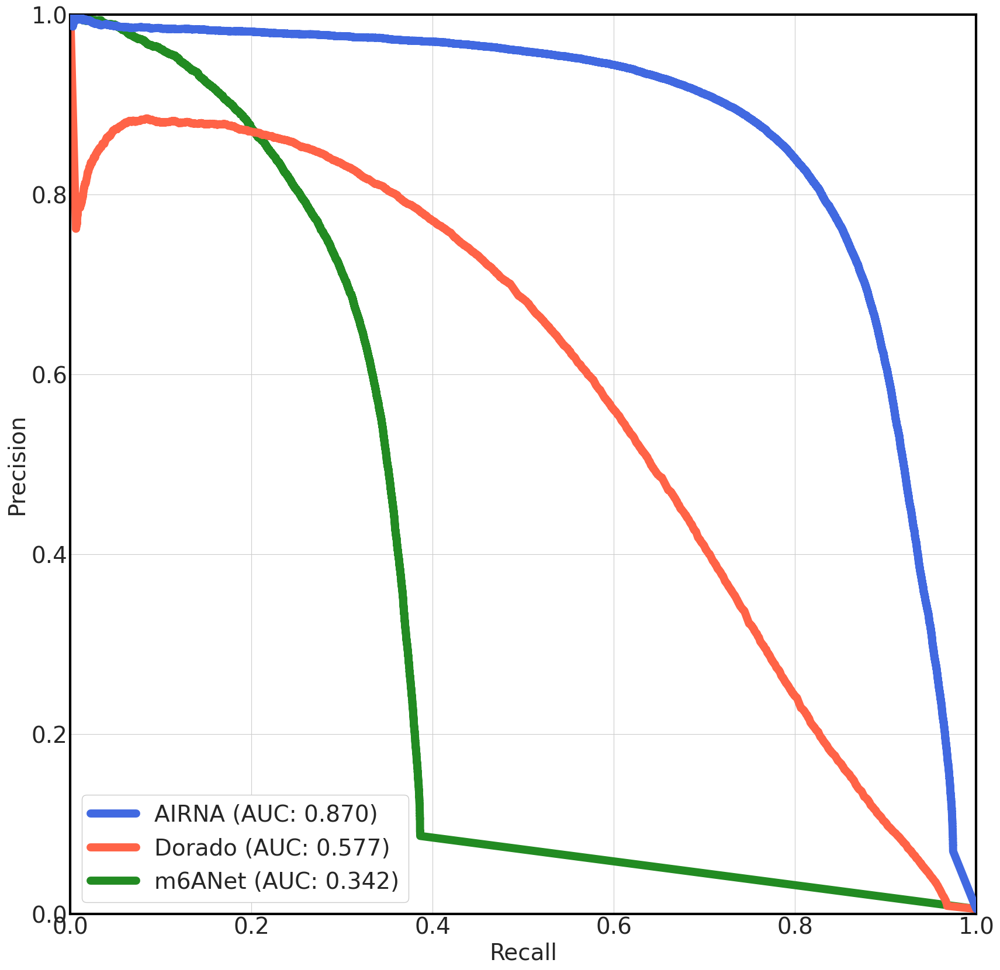

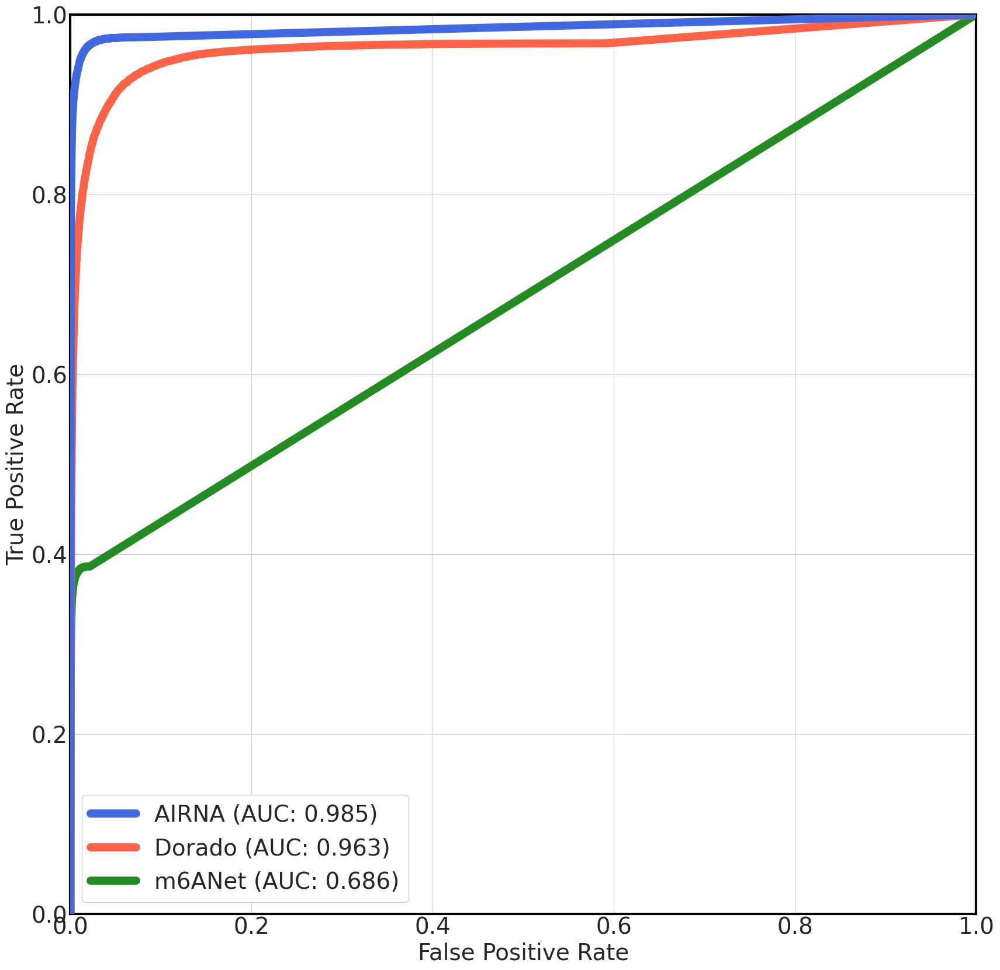

In [91]:


selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)

## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/allcontext_pr.pdf", format="pdf")
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/allcontext_roc.pdf", format="pdf")
plt.show()


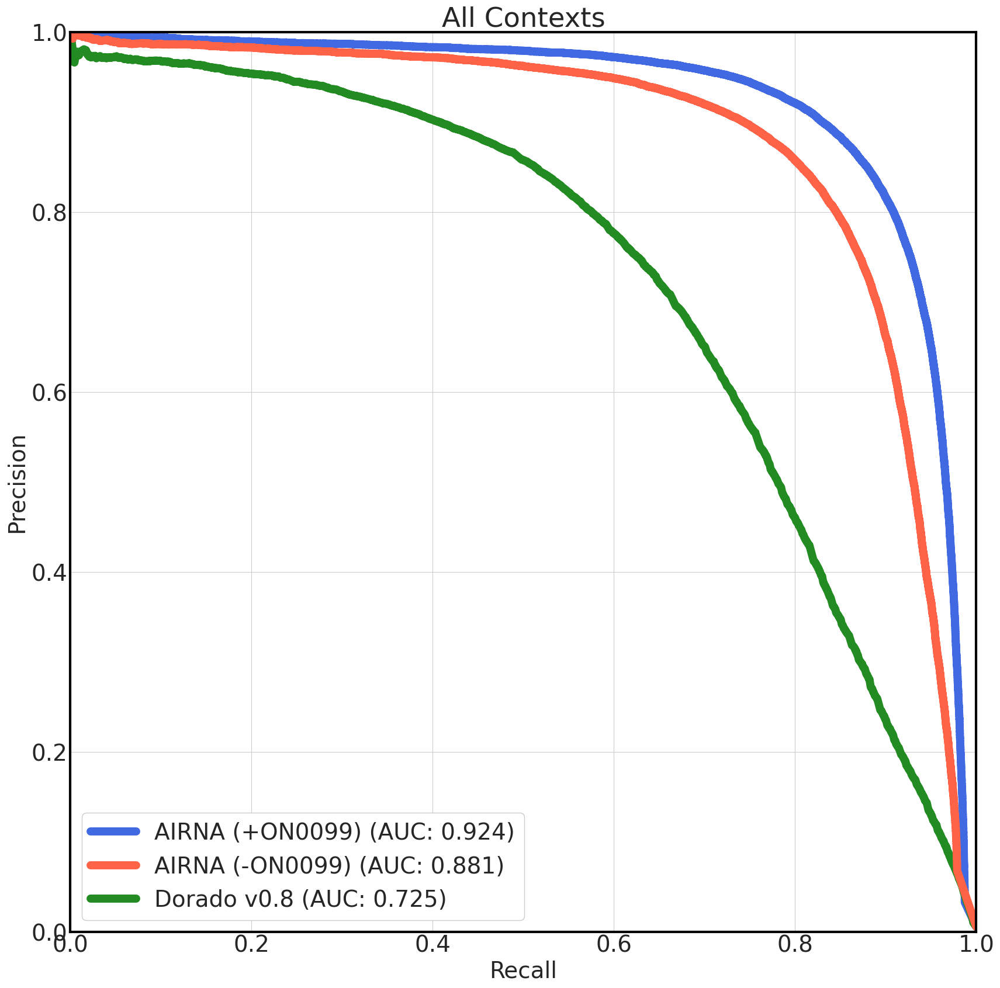

/tmp/ipykernel_216473/1638304641.py:47: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]


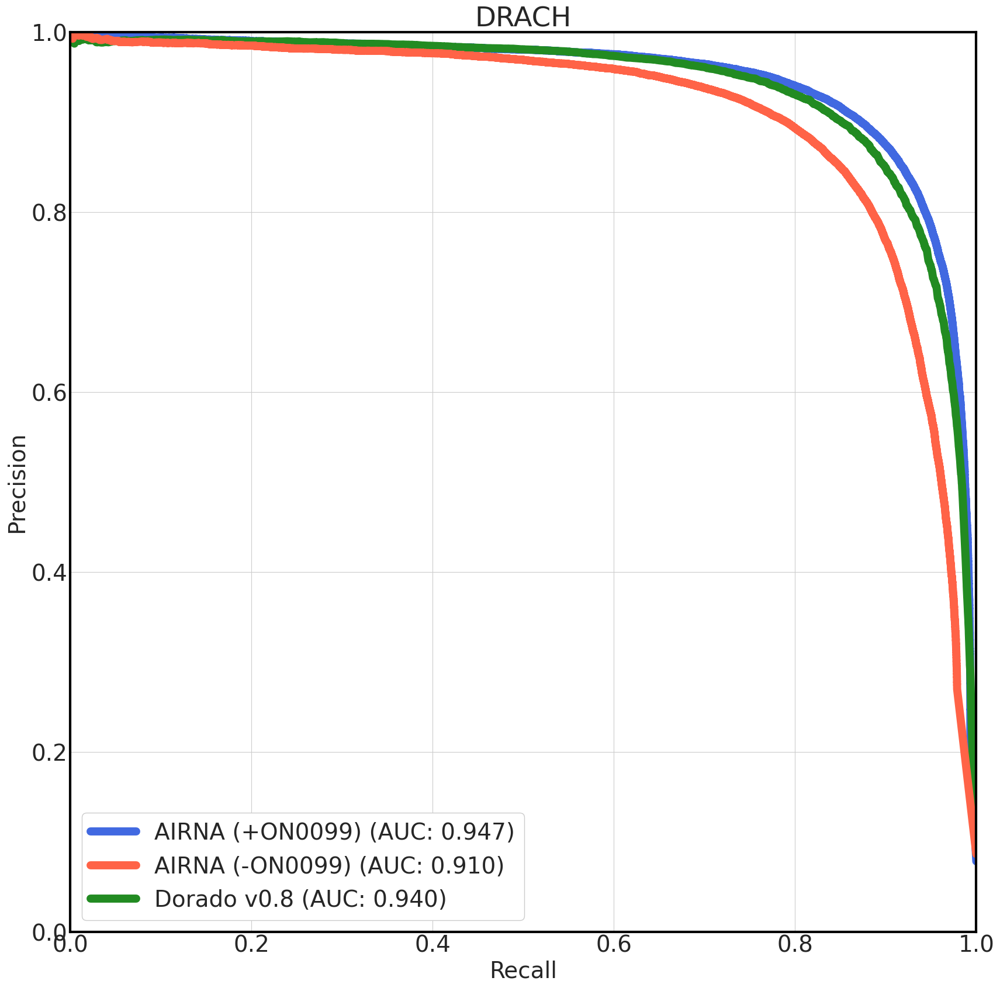

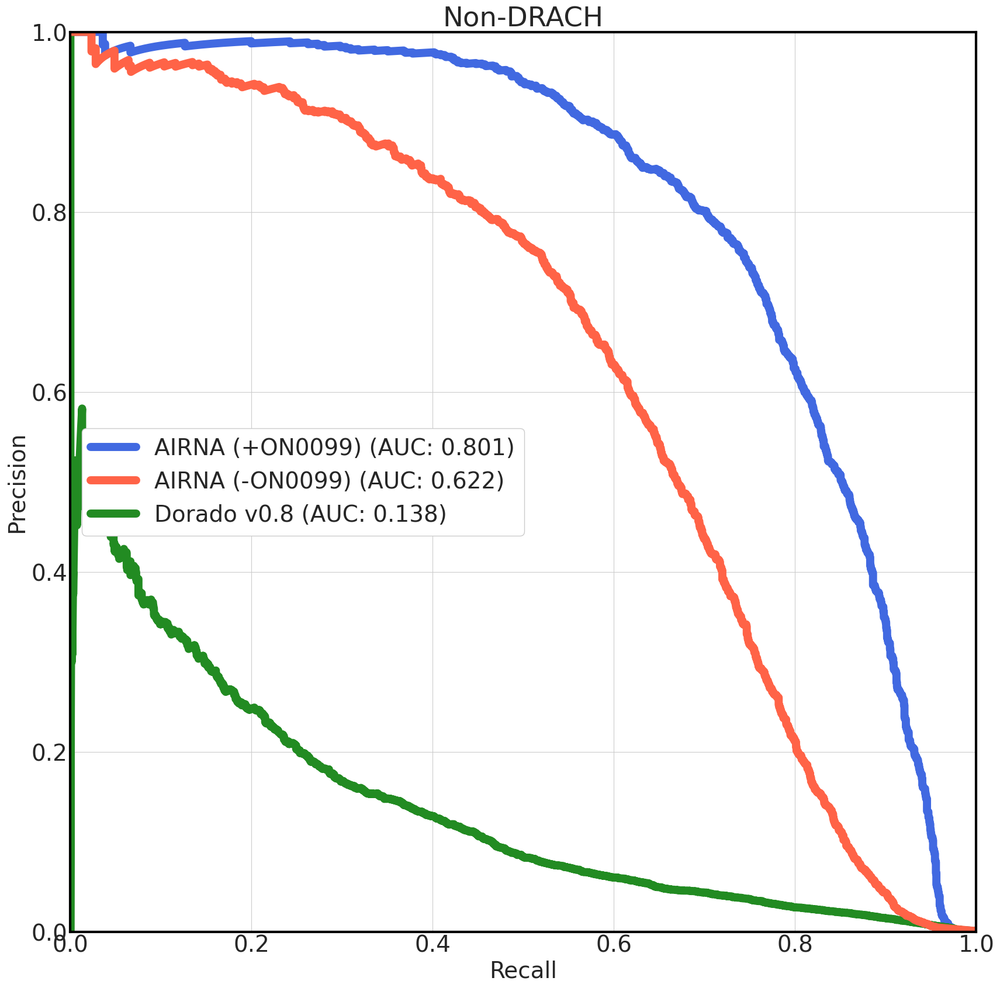

In [102]:
## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("All Contexts")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(~logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & (logsum_alt["count_all"] >= 100) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(~logsum_alt_nd["drach"]) & (logsum_alt_nd["label"] >= 0) & (logsum_alt_nd["count_all"] >= 100) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Non-DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()

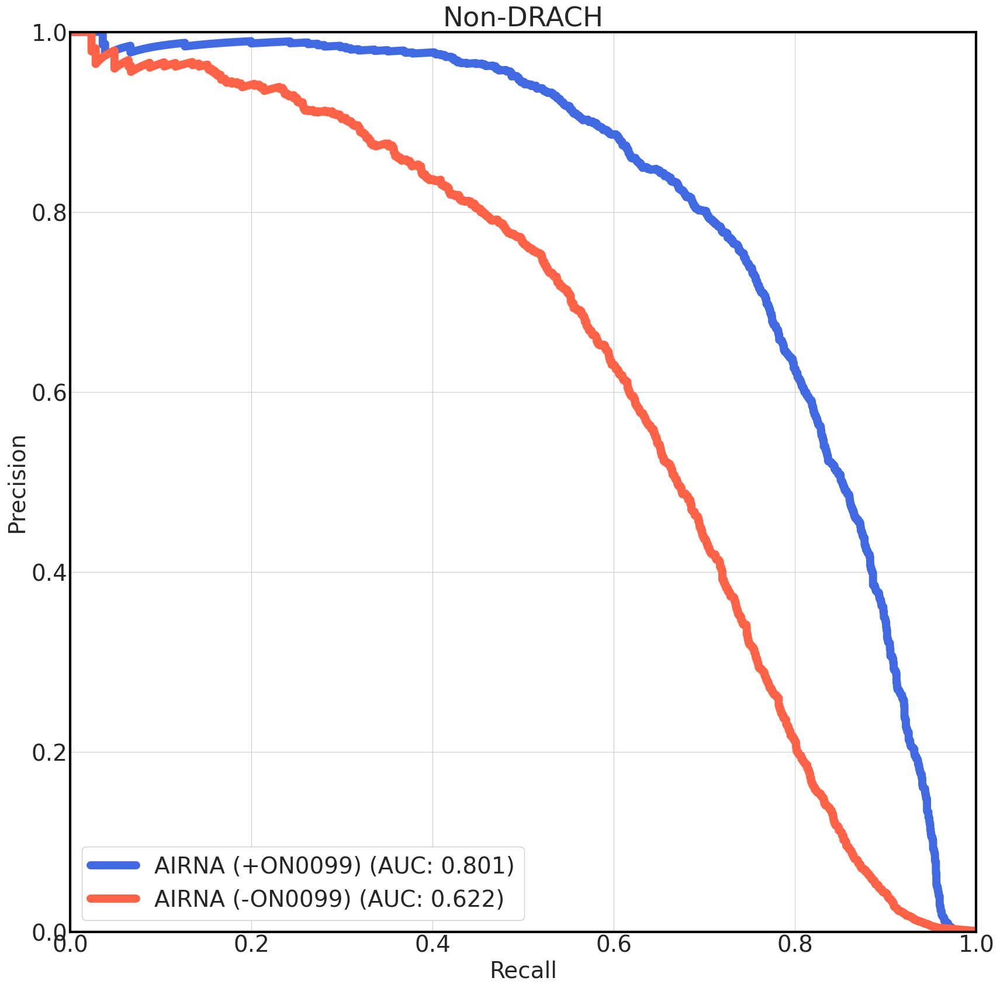

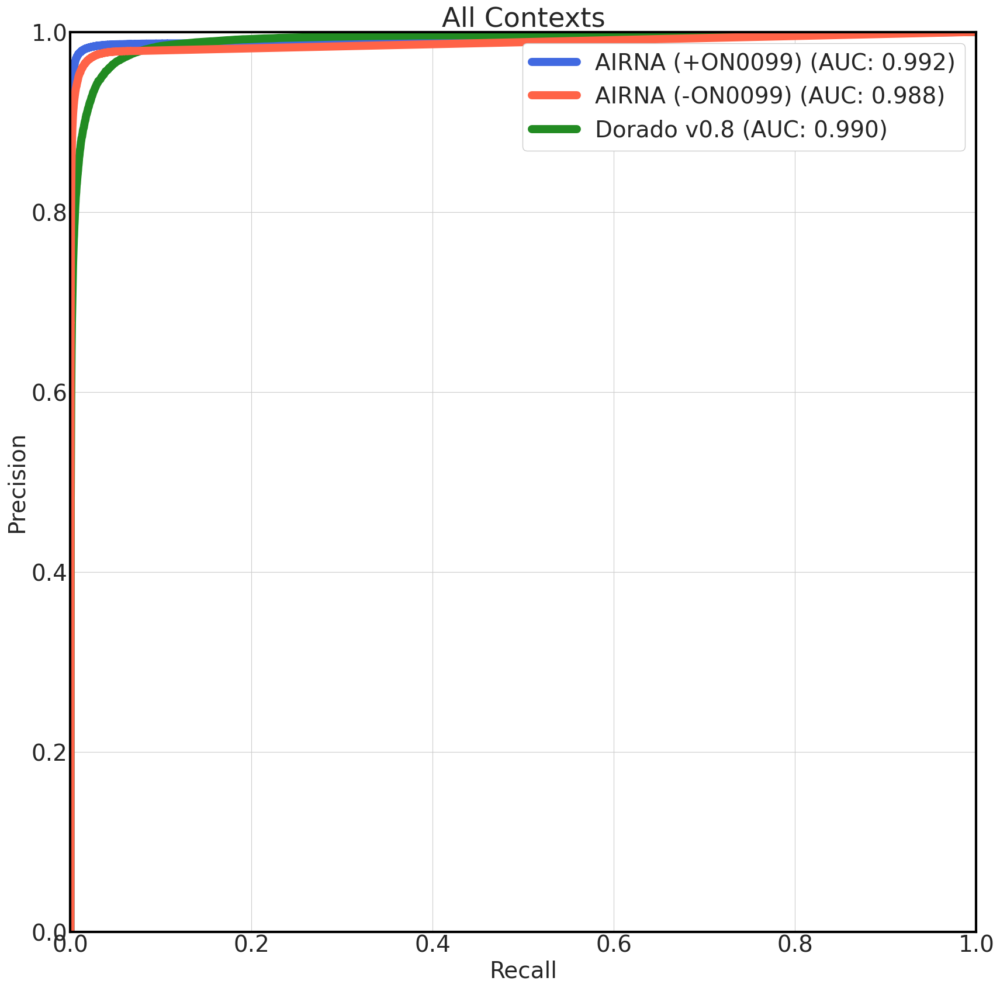

/tmp/ipykernel_216473/3544308905.py:49: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]


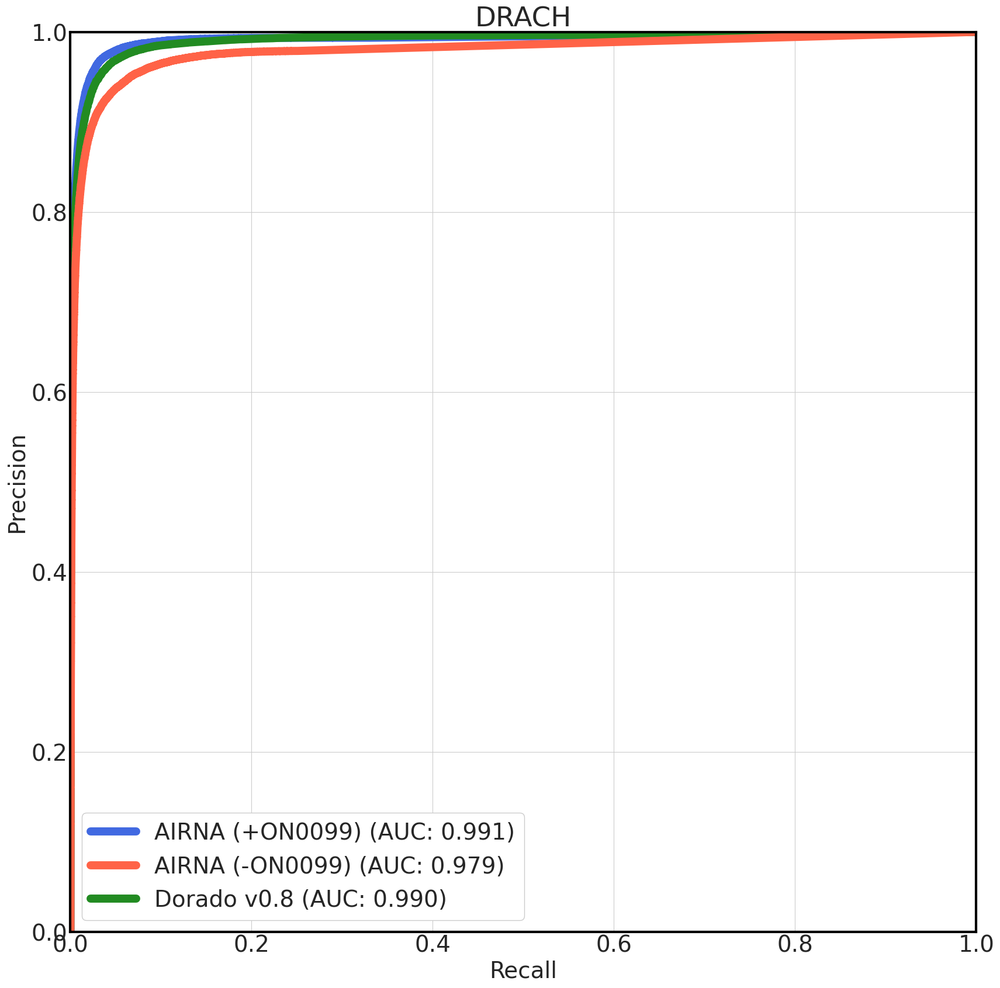

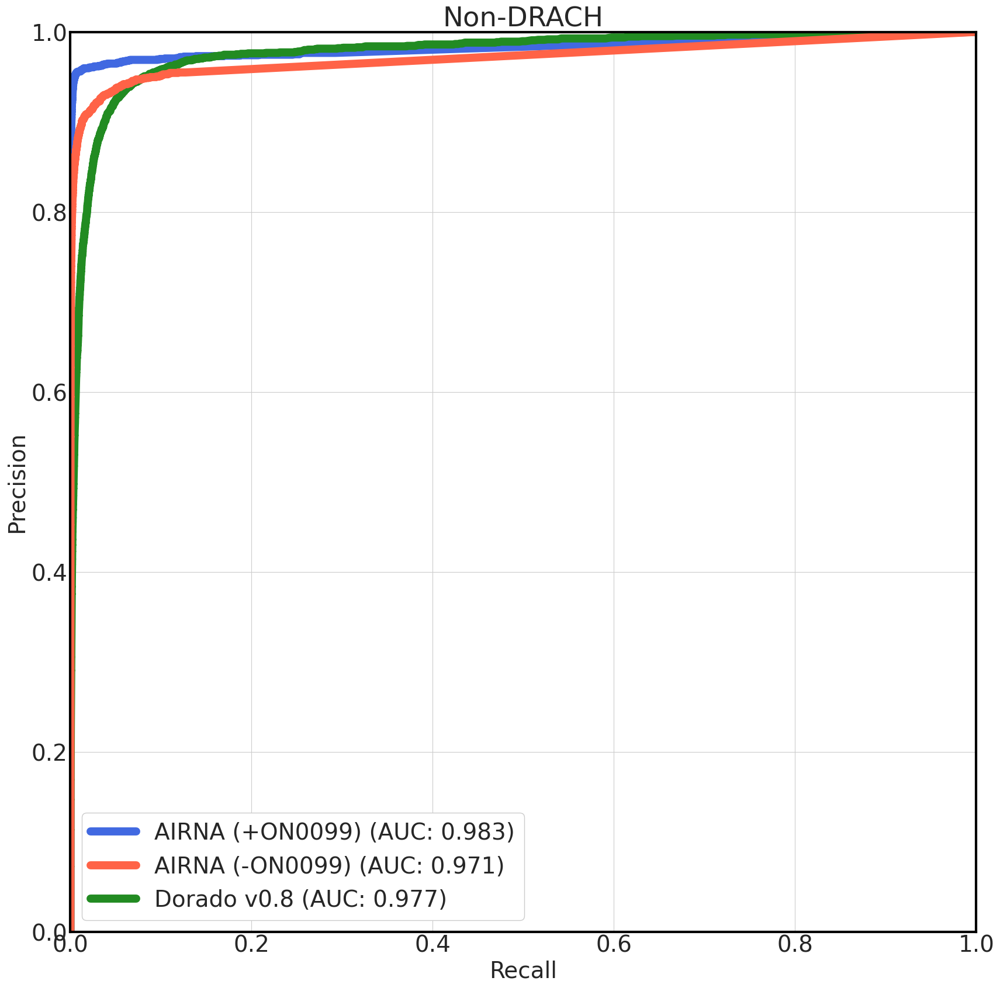

In [103]:
## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)


selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("All Contexts")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(~logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & (logsum_alt["count_all"] >= 100) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(~logsum_alt_nd["drach"]) & (logsum_alt_nd["label"] >= 0) & (logsum_alt_nd["count_all"] >= 100) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado8"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado v0.8 (AUC: {auc_score:.3f})", zorder=1)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Non-DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()

                label_id      pm6a       dom  count_all  count_dom  \
0         NM_000016:1000  0.000000  0.000000      258.0      258.0   
79        NM_000016:1245  0.043208  0.007634      266.0      262.0   
97        NM_000016:1302  0.913509  0.224335      265.0      263.0   
101       NM_000016:1320  0.176947  0.038023      265.0      263.0   
127       NM_000016:1371  0.014799  0.007605      266.0      263.0   
...                  ...       ...       ...        ...        ...   
10361914  NM_173793:3715  0.000000  0.000000        0.0        0.0   
10361915  NM_178537:2689  0.000000  0.000000        0.0        0.0   
10361916   NM_206967:906  0.000000  0.000000        0.0        0.0   
10361917  NR_034146:1986  0.000000  0.000000        0.0        0.0   
10361918   NR_161454:884  0.000000  0.000000        0.0        0.0   

          pred_dorado  dorado_count  pred_m6anet  dom_m6anet     index  depth  \
0              0.0000         258.0     0.000000    0.000000  12670442    268 

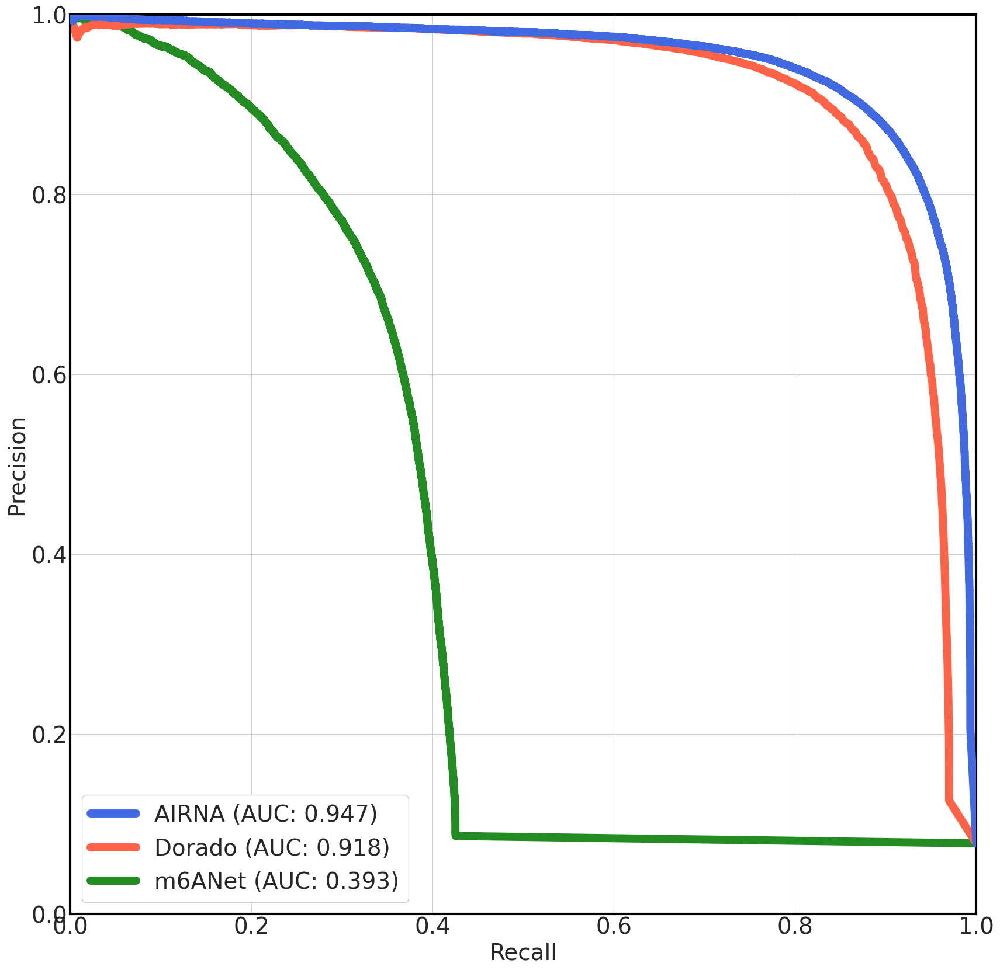

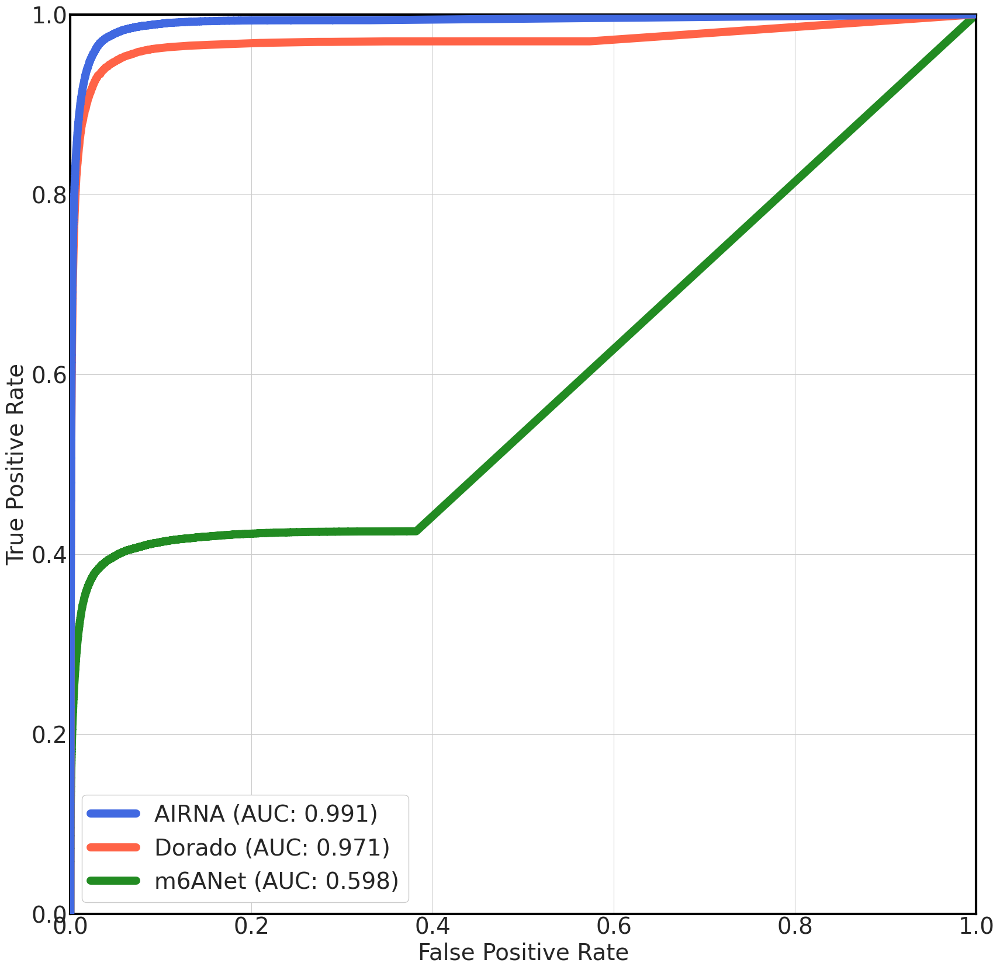

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)

print(selected_df)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/drach_pr.pdf", format="pdf")
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_m6anet"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"m6ANet (AUC: {auc_score:.3f})", zorder=1)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/drach_roc.pdf", format="pdf")
plt.show()


                label_id      pm6a       dom  count_all  count_dom  \
1         NM_000016:1008  0.000000  0.000000      257.0      256.0   
2         NM_000016:1009 -0.000000  0.003891      260.0      257.0   
3         NM_000016:1010 -0.000000  0.011583      263.0      259.0   
4         NM_000016:1014  0.000000  0.000000      258.0      252.0   
5         NM_000016:1020  0.000000  0.000000      262.0      259.0   
...                  ...       ...       ...        ...        ...   
10312864   NR_182661:975 -0.000000  0.009524      108.0      105.0   
10312865   NR_182661:985 -0.000000  0.049505      107.0      101.0   
10312866   NR_182661:992  0.029927  0.061224      108.0       98.0   
10312867   NR_182661:993 -0.000000  0.019417      107.0      103.0   
10312870   NR_182661:999 -0.000000  0.069307      106.0      101.0   

          pred_dorado  dorado_count  pred_m6anet  dom_m6anet     index  depth  \
1              0.0000         256.0          0.0         0.0  12670443    268 

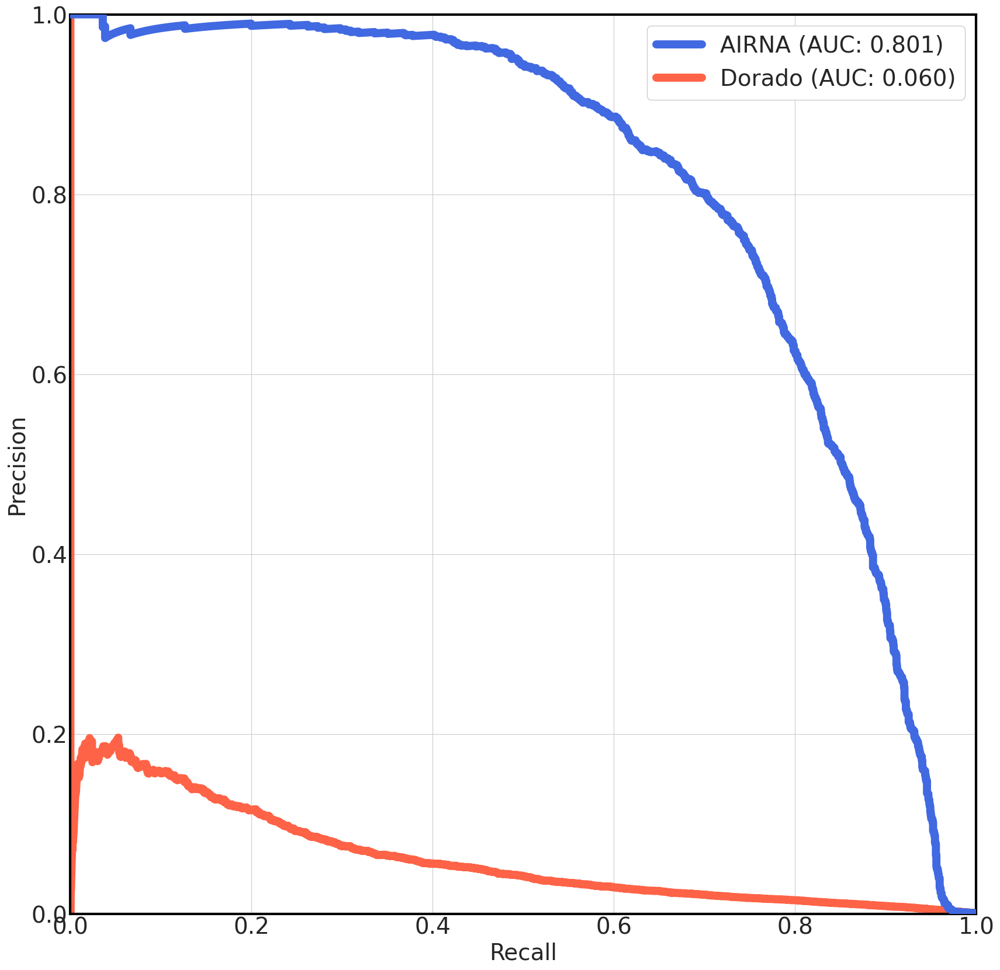

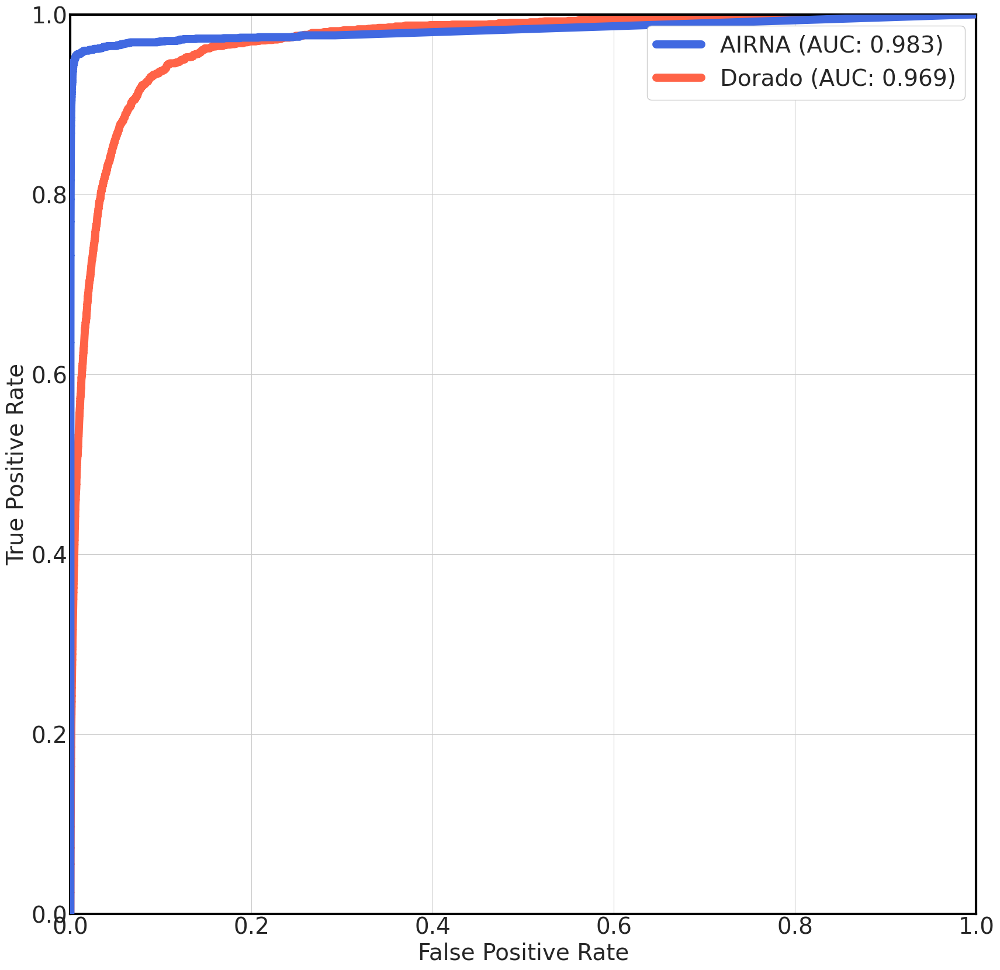

In [92]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[~(logsum_alt["drach"]) & ((logsum_alt["count_all"] >= 100)) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)

print(selected_df)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/nondrach_pr.pdf", format="pdf")
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/nondrach_roc.pdf", format="pdf")
plt.show()

                 label_id      pm6a       dom  count_all  pred_dorado  \
1384       NM_001010972:4  0.000000  0.000000      115.0       0.0150   
1386      NM_001010972:24  0.020536  0.007760      198.0       0.0194   
1387      NM_001010972:32  0.044295  0.040135      197.0       0.0798   
1388      NM_001010972:37  0.032965  0.009317      224.0       0.0448   
1389      NM_001010972:39 -0.000000  0.007941      225.0       0.0044   
...                   ...       ...       ...        ...          ...   
10311902   NM_207044:1084  0.000000  0.000000      102.0       0.0326   
10311903   NM_207044:1085 -0.000000  0.006754      102.0       0.0000   
10311904   NM_207044:1089 -0.000000  0.000803      100.0       0.0000   
10311905   NM_207044:1090  0.000000  0.000000      102.0       0.0208   
10311906   NM_207044:1091  0.000000  0.000000      101.0       0.0220   

          dorado_count  pred_m6anet  dom_m6anet     index  depth  label  \
1384             133.0          0.0         0.0 

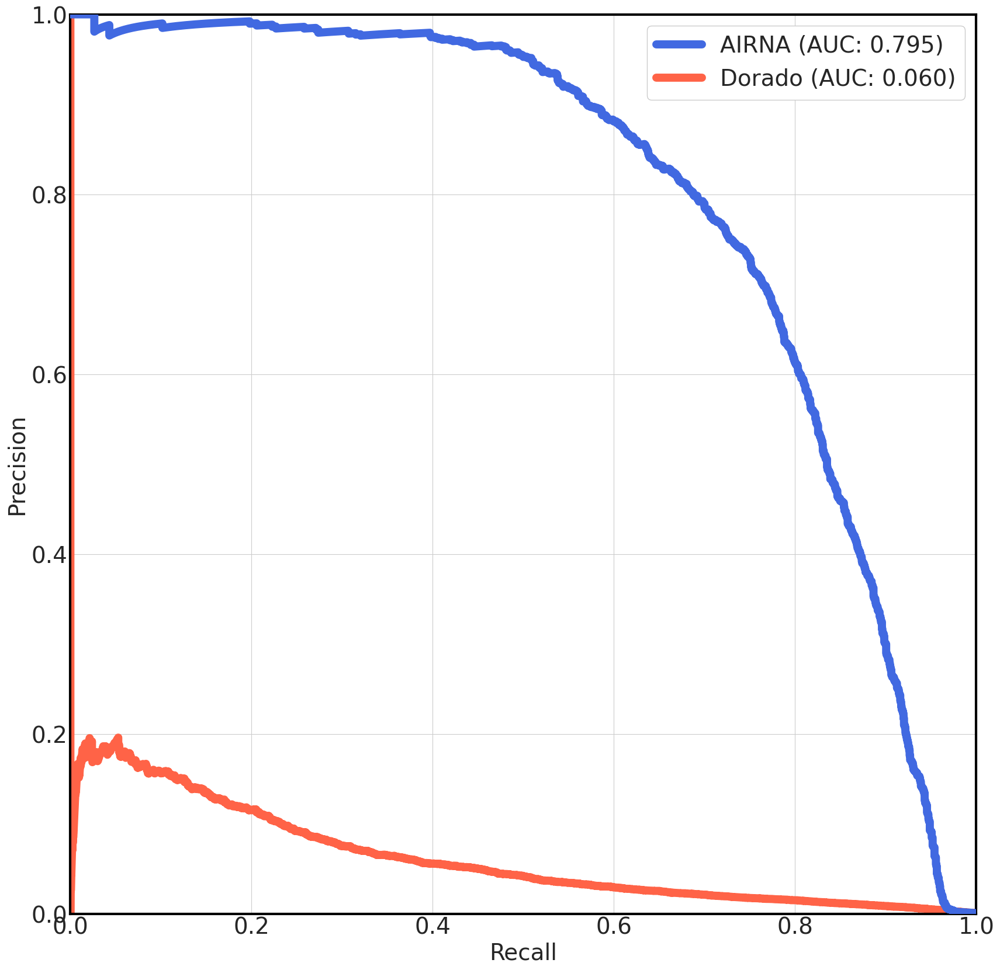

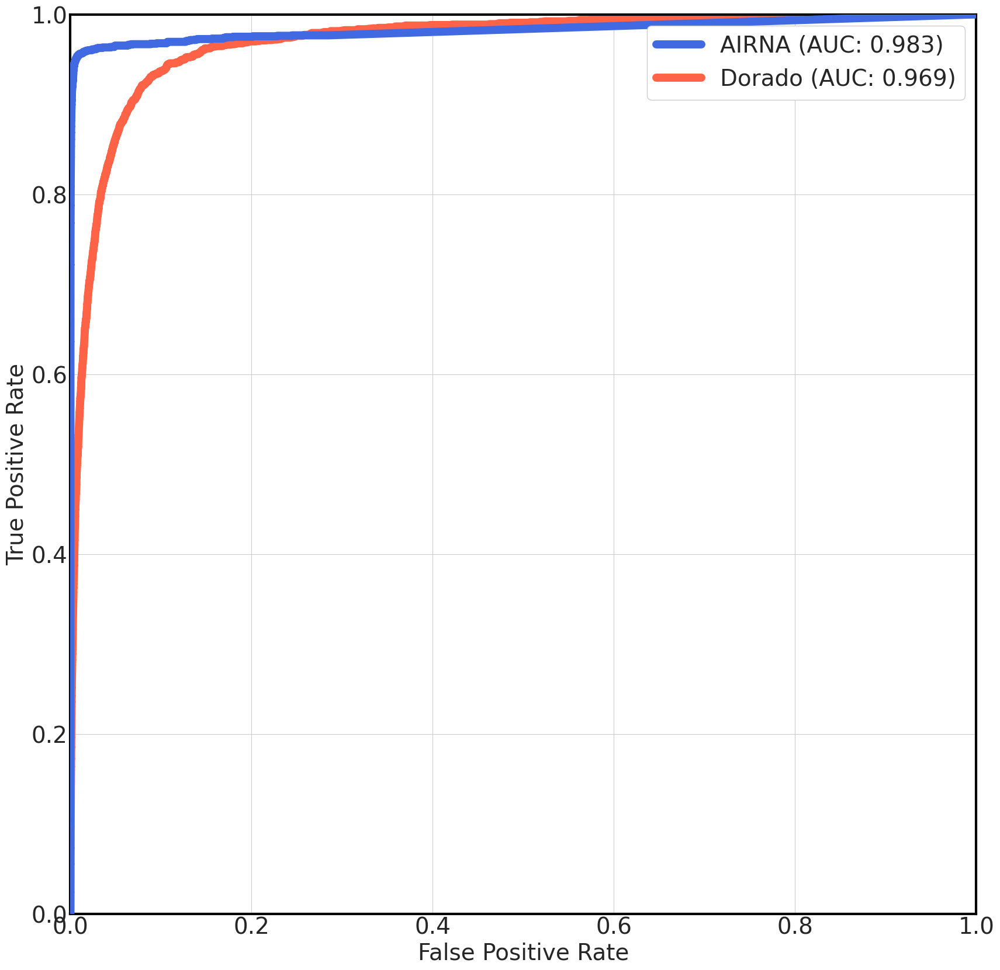

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt_nd[~(logsum_alt_nd["drach"]) & ((logsum_alt_nd["count_all"] >= 100)) & (logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)

print(selected_df)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)

## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/nondrach_pr.pdf", format="pdf")
plt.show()


## Plot ROC
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"AIRNA (AUC: {auc_score:.3f})", zorder=3)

fpr, tpr, _ = roc_curve(selected_df["label"], selected_df["pred_dorado"])
auc_score = auc(fpr, tpr)
ax.plot(fpr, tpr, label=f"Dorado (AUC: {auc_score:.3f})", zorder=2)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/nondrach_roc.pdf", format="pdf")
plt.show()

In [113]:
# logsum_alt_nd = "/extdata4/baeklab/Hyeonseo/m6A/inference/pileup/AIRNA-DW-v4-m6A-20241107-154905-27-393000-token_normalise_dwell_bq_npz_allmotiffinal/pileup.npz"
# logsum_alt_nd = "/extdata4/baeklab/Hyeonseo/m6A/inference/pileup/AIRNA-DW-v4-m6A-20241112-111125-0-15000-token_normalise_ver161024_ON0090_m6Afinal/pileup_strid.npz"
logsum_alt_nd = "/extdata4/baeklab/Hyeonseo/m6A/inference/pileup/AIRNA-DW-v4-m6A-20241107-154847-14-203000-token_normalise_ver161024_ON0090_m6Afinal/pileup_strid.npz"
with np.load(logsum_alt_nd, allow_pickle=True) as data:
    logsum_alt_nd = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_alt_nd = logsum_alt_nd[logsum_alt_nd["count_all"] >= 20]
logsum_alt_nd = logsum_alt_nd.merge(dorado_alt, on="label_id", how="outer")
logsum_alt_nd = logsum_alt_nd.merge(m6anet_df, on="label_id", how="outer")
logsum_alt_nd = logsum_alt_nd.merge(dorado_alt, on="label_id", how="outer")
logsum_alt_nd = logsum_alt_nd.fillna(0)
logsum_alt_nd = logsum_alt_nd.merge(label_alt_filtered, on="label_id", how="inner")
logsum_alt_nd = logsum_alt_nd.merge(label_glori, on="label_id", how="inner")
logsum_alt_nd["ambiguous"] = ((logsum_alt_nd["dom_alt"] > 0) & (logsum_alt_nd["dom_label"] == 0))|(logsum_alt_nd["dom_alt"] == 0) & (logsum_alt_nd["dom_label"] > 0)
print(logsum_alt_nd)

                label_id      pm6a       dom  count_all  count_pos  \
0            NM_198573:2  0.224072  0.086781       35.0        2.0   
1            NM_004134:2  0.000000  0.000000      132.0        0.0   
2            NM_004586:2  0.000000  0.000000       39.0        0.0   
3            NM_000581:2 -0.000000  0.000143       45.0        0.0   
4            NM_019102:2 -0.000000  0.018143      113.0        0.0   
...                  ...       ...       ...        ...        ...   
10362068  NM_173793:3715  0.000000  0.000000        0.0        0.0   
10362069  NM_178537:2689  0.000000  0.000000        0.0        0.0   
10362070   NM_206967:906  0.000000  0.000000        0.0        0.0   
10362071  NR_034146:1986  0.000000  0.000000        0.0        0.0   
10362072   NR_161454:884  0.000000  0.000000        0.0        0.0   

          kl_div_neg  kl_div_pos  logsum_1_p_pos  pred_dorado_x  \
0          24.436928    2.322182       -4.233072         0.0000   
1         131.510040    0

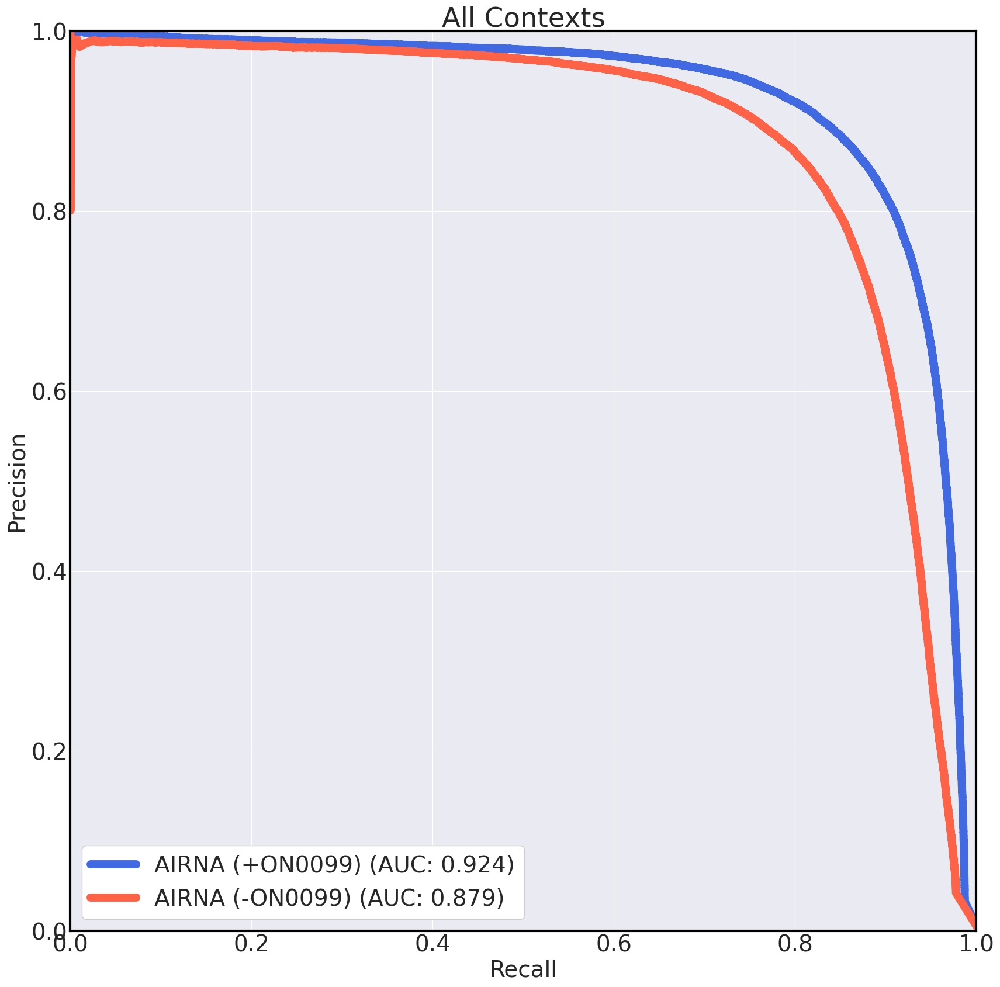

/tmp/ipykernel_216473/2257160800.py:44: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]


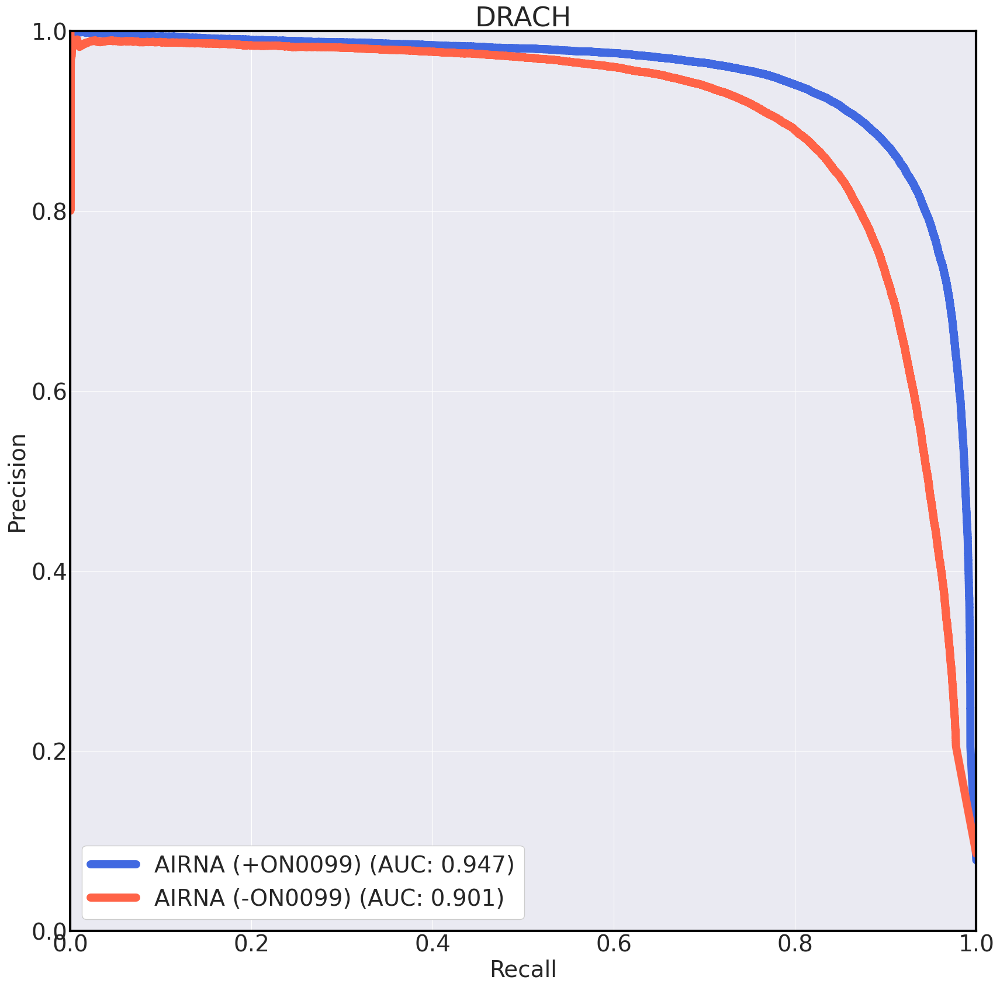

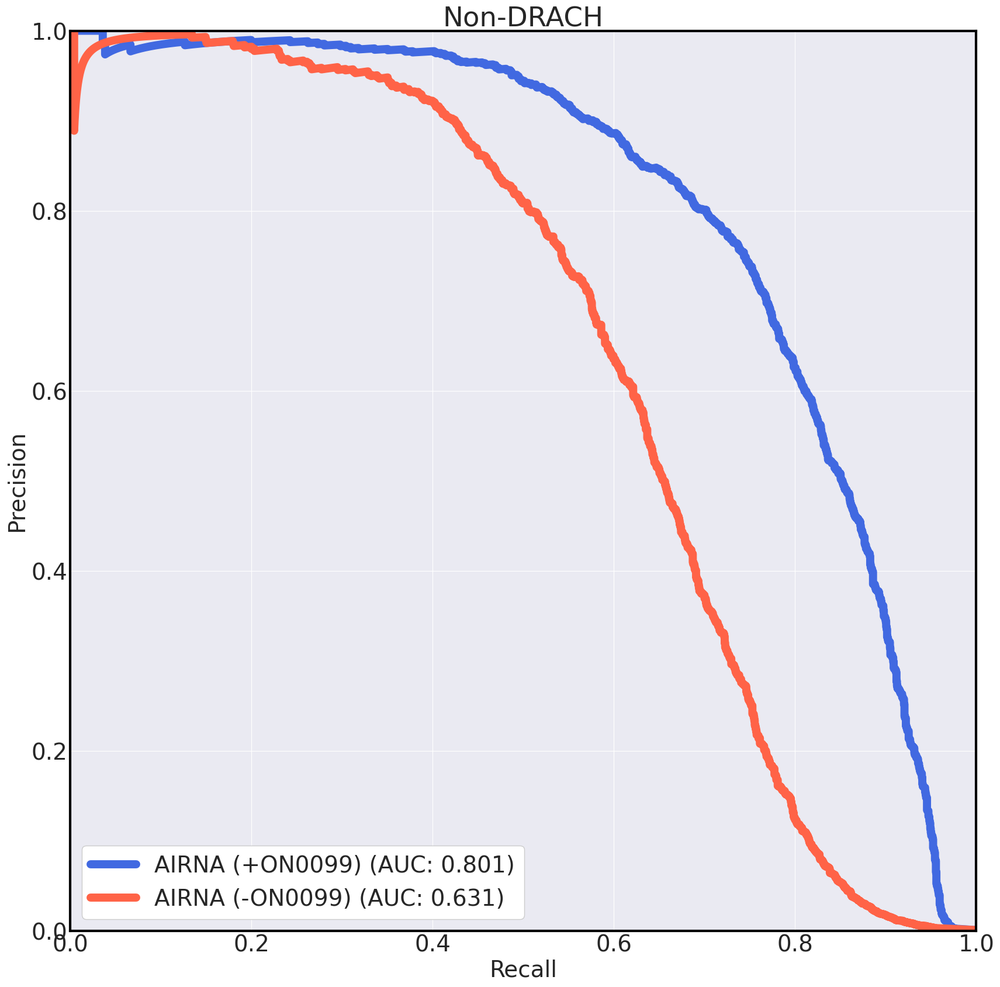

In [114]:
## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("All Contexts")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(logsum_alt_nd["label"] >= 0) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(logsum_alt_nd["drach"]) & (selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()


## Plot PR
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

selected_df = logsum_alt[(~logsum_alt["drach"]) & (logsum_alt["label"] >= 0) & (logsum_alt["count_all"] >= 100) & ~(logsum_alt["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (+ON0099) (AUC: {auc_score:.3f})", zorder=1)

selected_df = logsum_alt_nd[(~logsum_alt_nd["drach"]) & (logsum_alt_nd["label"] >= 0) & (logsum_alt_nd["count_all"] >= 100) & ~(logsum_alt_nd["ambiguous"])]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df.fillna(0, inplace=True)
precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA (-ON0099) (AUC: {auc_score:.3f})", zorder=2)


## Bolder grid outline
for dir in ["top", "right", "left", "bottom"]:
    ax.spines[dir].set_linewidth(3)
    ax.spines[dir].set_color("black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Non-DRACH")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.legend()
plt.show()

In [13]:

selected_df = logsum_alt[(logsum_alt["count_dom"] >= 20) & (logsum_alt["dorado_count"] >= 20) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"] )]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

precision, recall, thresholds = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
f1 = 2 * (precision * recall) / (precision + recall)

f1_argmax = np.argmax(f1)
max_f1 = f1[f1_argmax]
threshold = thresholds[f1_argmax]

print(f"Max F1: {max_f1:.3f}, Threshold: {threshold:.3f}")

Max F1: 0.872, Threshold: 0.712


In [59]:

selected_df = logsum_alt[(logsum_alt["count_dom"] >= 20) & (logsum_alt["dorado_count"] >= 20) & (logsum_alt["label"] >= 0) & ~(logsum_alt["ambiguous"] )]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

precision, recall, thresholds = precision_recall_curve(selected_df["label"], selected_df["pred_m6anet"])
f1 = 2 * (precision * recall) / (precision + recall)

f1_argmax = np.argmax(f1)
max_f1 = f1[f1_argmax]
m6anet_threshold = thresholds[f1_argmax]

print(f"Max F1: {max_f1:.3f}, Threshold: {m6anet_threshold:.3f}")

Max F1: 0.442, Threshold: 0.548


In [14]:
## Get threshold for 90% Recall
threshold2 = thresholds[np.argmax(recall <= 0.90) - 1]
print(f"90% Recall Threshold: {threshold2:.3f}")


90% Recall Threshold: 0.602


In [15]:
print(logsum_alt[logsum_alt["pm6a"] > threshold])

                label_id      pm6a       dom  count_all  count_dom  \
97        NM_000016:1302  0.913509  0.224335      265.0      263.0   
743       NM_000017:1373  2.437110  0.632000      130.0      125.0   
1212      NM_000021:1730  2.817645  0.916667      145.0      144.0   
1231      NM_000021:1814  0.778251  0.201493      143.0      134.0   
1235      NM_000021:1833  2.695632  0.876812      142.0      138.0   
...                  ...       ...       ...        ...        ...   
10313548  NR_182668:1123  1.622275  0.695652       24.0       23.0   
10313576  NR_182668:1218  1.598122  0.304348       24.0       23.0   
10313586  NR_182668:1249  0.949800  0.173913       24.0       23.0   
10313600  NR_182668:1277  1.088306  0.173913       23.0       23.0   
10314415   NR_182668:996  1.991652  0.652174       24.0       23.0   

          pred_dorado  dorado_count  pred_m6anet  dom_m6anet     index  depth  \
97             0.2189         265.0     0.000000    0.000000  12670542    271 

In [16]:
logsum_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v4-20240905-092858-10-177000-token_normalise_dwell_bq_npz_allmotif_pileup_psum/pileup.npz"
with np.load(logsum_df, allow_pickle=True) as data:
    logsum_df = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_df = logsum_df[logsum_df["count_dom"] >= 20]
logsum_df = logsum_df.merge(label_df, on="label_id", how="inner")
print(logsum_df)

                label_id      p_sum  logsum_p_pos  logsum_1_p_pos  count_pos  \
0         NM_000016:1000   0.606511      0.000000        0.000000          0   
1         NM_000016:1008   0.948786      0.000000        0.000000          0   
2         NM_000016:1009   2.607620      0.000000        0.000000          0   
3         NM_000016:1010   4.912612      0.000000        0.000000          0   
4         NM_000016:1014   3.237954      0.000000        0.000000          0   
...                  ...        ...           ...             ...        ...   
15992331    NR_184306:85   1.133184      0.000000        0.000000          0   
15992332    NR_184306:87   3.771550     -0.001452       -2.476578          1   
15992333    NR_184306:88   2.137289      0.000000        0.000000          0   
15992334    NR_184306:93  32.341377     -0.011076      -78.301079         23   
15992335    NR_184306:98   4.046034      0.000000        0.000000          0   

          logsum_p_neg  logsum_1_p_neg 

In [17]:
logsum_df["pm6a"] =  -(2-logsum_df["dom"])*logsum_df["logsum_1_p_pos"]/logsum_df["count_all"] + ((1-logsum_df["dom"])*np.log10(np.clip(1-logsum_df["dom"],1e-30,1)) + logsum_df["dom"] * np.log10(np.clip(logsum_df["dom"],1e-30,1)))*(logsum_df["count_pos"]/logsum_df["count_all"])


In [18]:
## Plot DoM KDE

/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


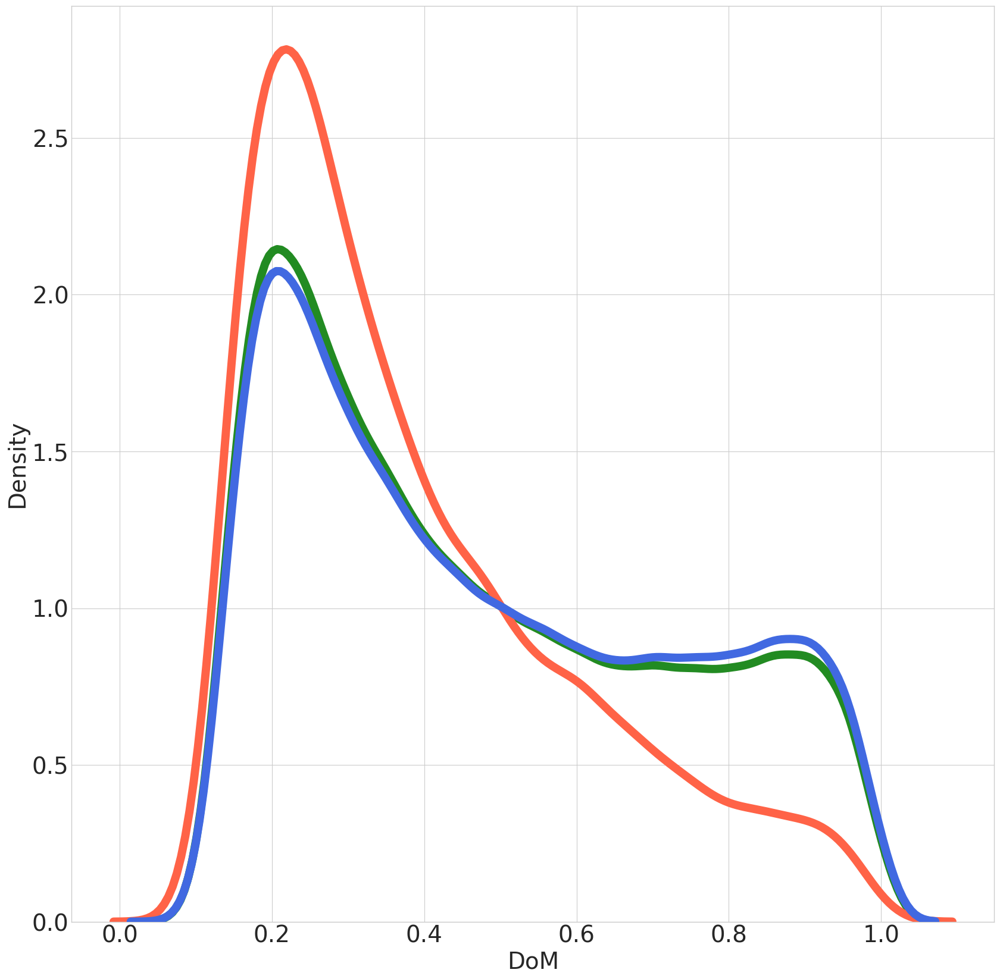

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

m6a_df = logsum_df[logsum_df["pm6a"] > threshold]

## DRACH
sns.kdeplot(m6a_df[m6a_df["drach"]]["dom"], ax=ax, label="DRACH", color="royalblue", zorder=3, common_norm=True)
## Non-DRACH
sns.kdeplot(m6a_df[~m6a_df["drach"]]["dom"], ax=ax, label="Non-DRACH", color="tomato", zorder=2, common_norm=True)
## ALL
sns.kdeplot(m6a_df["dom"], ax=ax, label="All", color="forestgreen", zorder=1, common_norm=True)

ax.set_xlabel("DoM")
ax.set_ylabel("Density")
plt.show()


/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


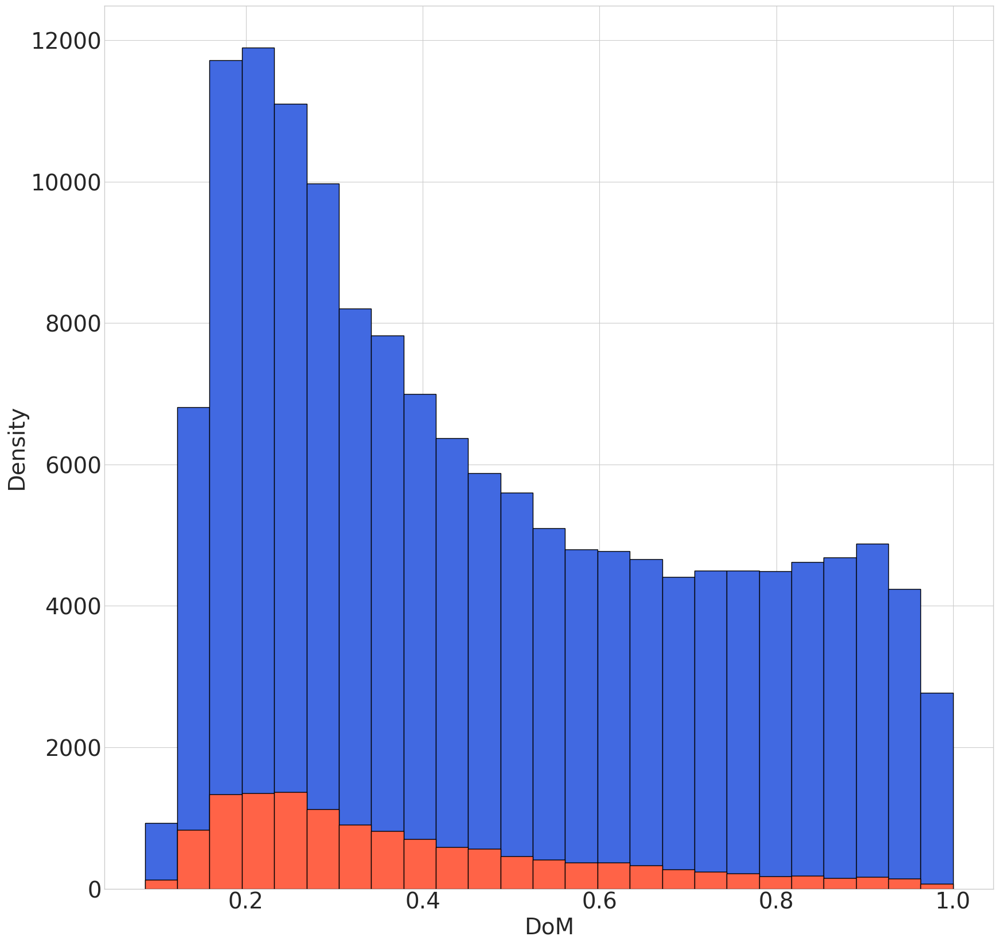

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

m6a_df = logsum_df[logsum_df["pm6a"] > threshold]

## Stacked histogram. non-DRACH at the bottom, DRACH at the top
sns.histplot(m6a_df[~m6a_df["drach"]]["dom"], ax=ax, color="tomato", zorder=3, common_norm=True, bins=25, alpha=1)
sns.histplot(m6a_df["dom"], ax=ax, color="royalblue", zorder=2, common_norm=True, bins=25, alpha=1)

ax.set_xlabel("DoM")
ax.set_ylabel("Density")
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/dom_hist.pdf", format="pdf")
plt.show()


In [21]:
## Draw Pie Chart
threshold=0.712
m6a_df = logsum_df[logsum_df["pm6a"] > threshold]

In [22]:
m6a_df["coding"] = m6a_df["label_id"].str.startswith("NM")


drach_coding = len(m6a_df[(m6a_df["drach"]) & (m6a_df["coding"])])
drach_noncoding = len(m6a_df[(m6a_df["drach"]) & (~m6a_df["coding"])])
non_drach_coding = len(m6a_df[(~m6a_df["drach"]) & (m6a_df["coding"])])
non_drach_noncoding = len(m6a_df[(~m6a_df["drach"]) & (~m6a_df["coding"])])

print(drach_coding, drach_noncoding, non_drach_coding, non_drach_noncoding)


128327 10099 12120 1141


/tmp/ipykernel_216473/2415117767.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m6a_df["coding"] = m6a_df["label_id"].str.startswith("NM")


In [23]:

print(np.array([drach_coding, drach_noncoding, non_drach_coding, non_drach_noncoding, ])/len(m6a_df))

[0.84599867 0.06657789 0.07990138 0.00752207]


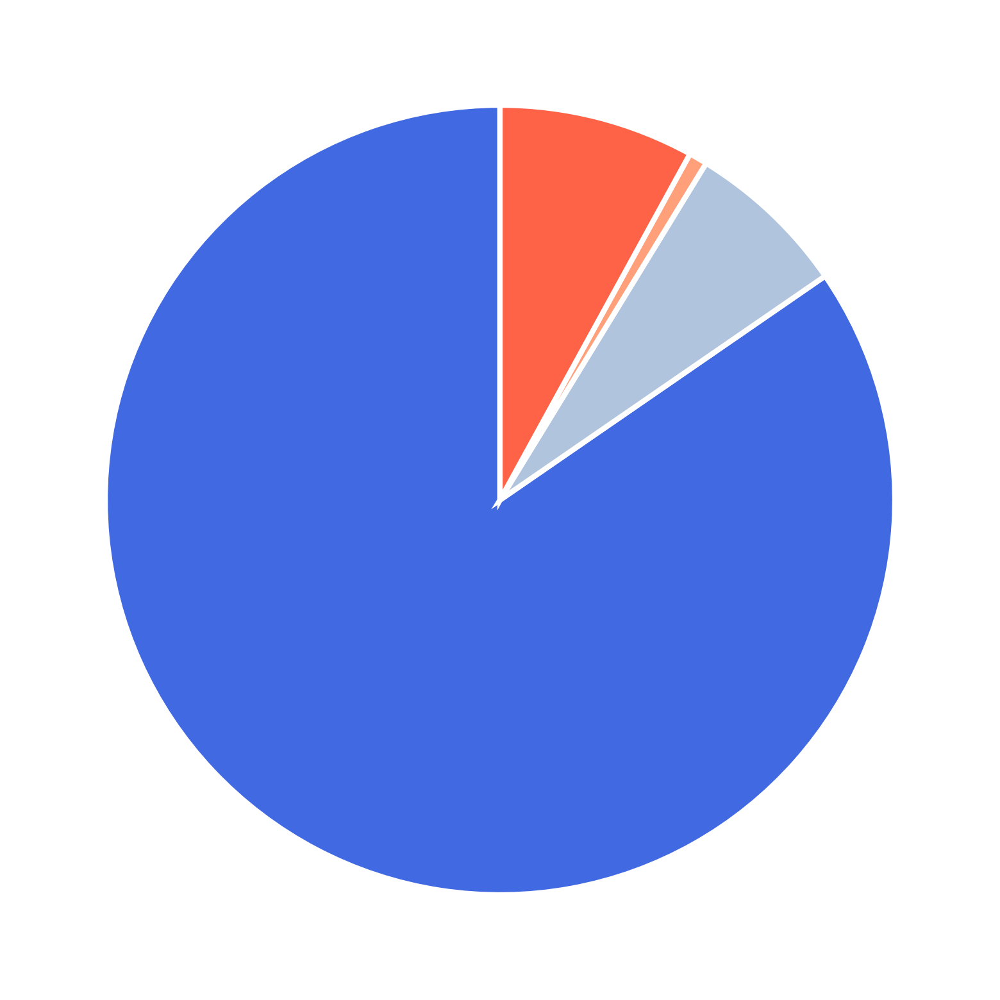

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
y = [drach_coding, drach_noncoding, non_drach_noncoding, non_drach_coding, ]
plt.rcParams.update({'font.size': 32, 'lines.linewidth': 6})
wp = {'linewidth': 6, 'edgecolor':'white'}
colors = ['royalblue', 'lightsteelblue', 'lightsalmon', 'tomato', ]
plt.pie(y,startangle = 90, colors=colors, wedgeprops=wp)
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/pie.pdf", format="pdf")
plt.show()

     5mer  count
0   GGACT  26350
1   GGACA  19804
2   AGACT  16915
3   GAACT  16504
4   GGACC  13080
5   TGACT  11378
6   AAACT   9341
7   AGACA   6697
8   GAACA   5456
9   GGACG   4679
10  AGACC   3071
11  GAACC   2498
12  TGACA   2485
13  GGATT   2367
14  TAACT   2082
15  AAACA   1354
16  AGACG    968
17  GTACT    875
18  TGACC    816
19  GAACG    588


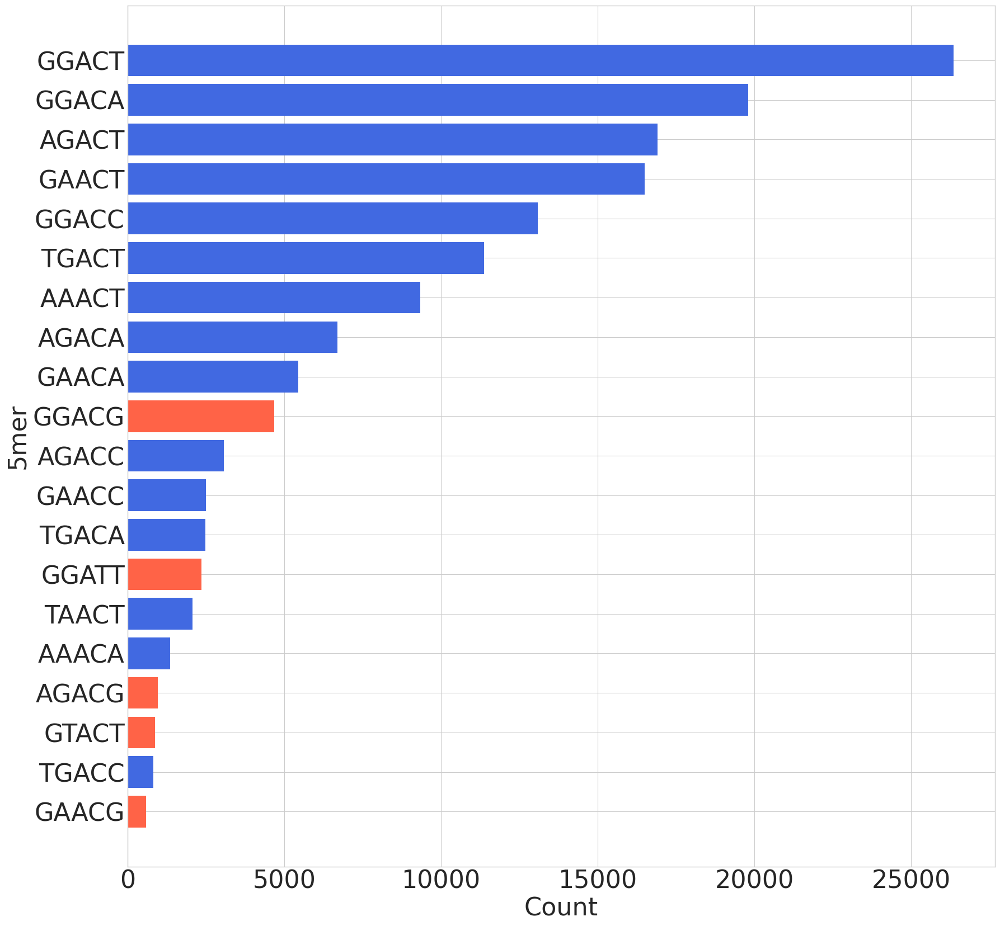

In [25]:
## Plot Top 20 5mers


import re
def is_drach(seq):
    seq = seq.upper()
    if re.search(r'[AGUT][AG]AC[ACUT]', seq):
        return True
    else:
        return False
    
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
count_5mers = m6a_df["5mer"].value_counts().head(20)

## Color by DRACH: True: Royalblue, False: Tomato
## use is_drach function
count_5mers = count_5mers.reset_index()

print(count_5mers)
count_5mers["drach"] = count_5mers["5mer"].apply(is_drach)
count_5mers["color"] = count_5mers["drach"].map({True: "royalblue", False: "tomato"})
count_5mers.sort_values("count", inplace=True)
ax.barh(count_5mers["5mer"], count_5mers["count"], color=count_5mers["color"])
ax.set_xlabel("Count")
ax.set_ylabel("5mer")
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/top20_5mers.pdf", format="pdf")
plt.show()

In [30]:
from Bio import SeqIO
ref_path = "/extdata4/baeklab/Hyeonseo/m6A/res/ref/isoform/hg38_rna_nrnm.fasta"
fasta_dict = SeqIO.to_dict(SeqIO.parse(ref_path, "fasta"))
fasta_dict = {x.split(".")[0]: y for x, y in fasta_dict.items()}
m6a_df = logsum_df[logsum_df["pm6a"] > threshold].copy()
m6a_df["nmid"] = m6a_df["label_id"].str.split(":").str[0]
m6a_df["pos"] = m6a_df["label_id"].str.split(":").str[1].astype(np.int32)
m6a_df["seq"] = m6a_df.apply(lambda x: str(fasta_dict[x["nmid"]].seq)[x["pos"]-10:x["pos"]+11], axis=1)

In [31]:
m6a_df = m6a_df[m6a_df["seq"].str.len() == 21]
for i in range(21):
    m6a_df[str(i)] = m6a_df["seq"].str[i]

logo_df = m6a_df[[str(i) for i in range(21)]].copy()
logo_df = logo_df.apply(lambda x: x.value_counts()).transpose()
    
        

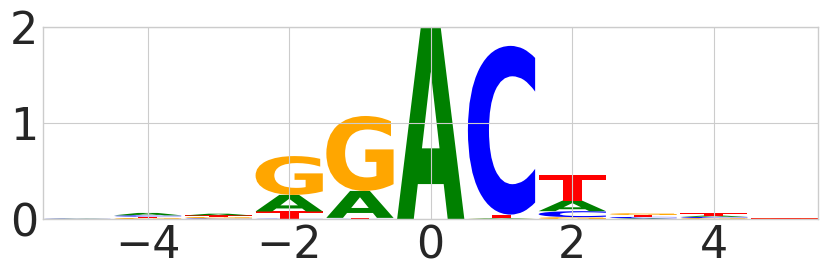

In [32]:
import logomaker as lm
bit_df = logo_df.iloc[5:16].copy()
bit_df.index = np.arange(11) - 5
bit_df = bit_df.apply(lambda x: x/x.sum(), axis=1)
bit_df = bit_df.apply(lambda x: x*(2+(x*np.log2(x)).sum()), axis=1)
logo = lm.Logo(bit_df.fillna(0), color_scheme="classic")
plt.xticks([-4,-2,0,2,4])
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/seqlogo.pdf", format="pdf")
plt.show()


In [39]:
logsum_df_hela = "/extdata4/baeklab/Hyeonseo/m6A/inference/pileup/AIRNA-DW-v4-20240905-092858-10-177000-token_normalise_dwell_bq_npz_allmotif-ON0091_m6Afinal/pileup.npz"
hela_label = pd.read_csv("/extdata4/baeklab/Hyeonseo/m6A/runs/exp_MRNA/ON0091/ON0091/label/Baeklab.070.eTAMv2.GP3.depth5_None.twm6astrict.tsv", sep='\t')
hela_label.rename(columns = {"id": "label_id","m6A_level": "dom_label"}, inplace = True)
with np.load(logsum_df_hela, allow_pickle=True) as data:
    logsum_df_hela = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_df_hela = logsum_df_hela[logsum_df_hela["count_all"] >= 20]
logsum_df_hela = logsum_df_hela.merge(hela_label, on="label_id", how="inner")


In [40]:


def calc_pm6a(df):
    return -(2-df["dom"])*df["logsum_1_p_pos"]/df["count_all"] + ((1-df["dom"])*np.log10(np.clip(1-df["dom"],1e-30,1)) + df["dom"] * np.log10(np.clip(df["dom"],1e-30,1)))*(df["count_pos"]/df["count_all"])

logsum_df_hela["pm6a"] = calc_pm6a(logsum_df_hela)

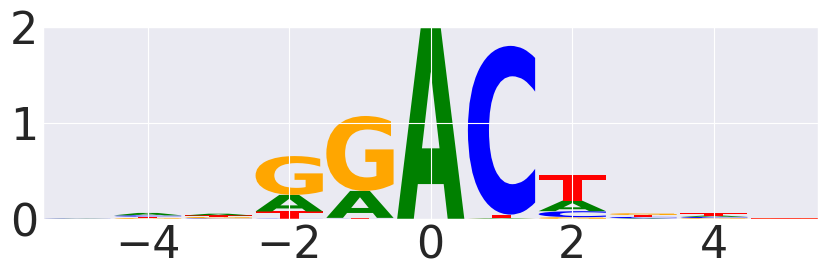

In [41]:
m6a_df_hela = logsum_df_hela[logsum_df_hela["pm6a"] > threshold].copy()
m6a_df_hela["nmid"] = m6a_df_hela["label_id"].str.split(":").str[0]
m6a_df_hela["pos"] =  m6a_df_hela["label_id"].str.split(":").str[1].astype(np.int32)
m6a_df_hela["seq"] =  m6a_df_hela.apply(lambda x: str(fasta_dict[x["nmid"]].seq)[x["pos"]-10:x["pos"]+11], axis=1)
bit_df = logo_df.iloc[5:16].copy()
bit_df.index = np.arange(11) - 5
bit_df = bit_df.apply(lambda x: x/x.sum(), axis=1)
bit_df = bit_df.apply(lambda x: x*(2+(x*np.log2(x)).sum()), axis=1)
logo = lm.Logo(bit_df.fillna(0), color_scheme="classic")
plt.xticks([-4,-2,0,2,4])
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/seqlogo.pdf", format="pdf")
plt.show()


     5mer  count
0   GGACT  23358
1   GGACA  17810
2   AGACT  15015
3   GAACT  14878
4   GGACC  12042
5   TGACT  10311
6   AAACT   8057
7   AGACA   5993
8   GAACA   4846
9   GGACG   4194
10  AGACC   2735
11  GAACC   2444
12  TGACA   2319
13  GGATT   2140
14  TAACT   1883
15  AAACA   1222
16  AGACG    892
17  GTACT    892
18  TGACC    795
19  CAACT    519


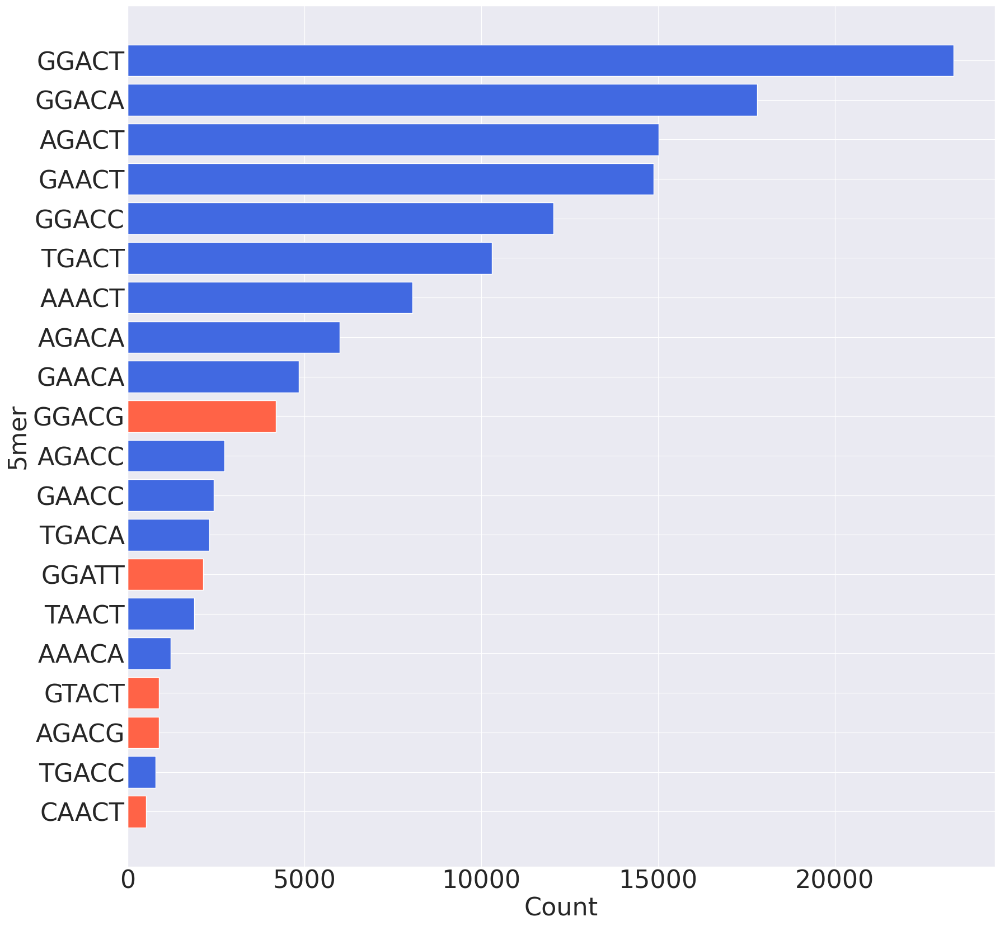

In [42]:
## Plot Top 20 5mers
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
count_5mers = m6a_df_hela["5mer"].value_counts().head(20)

## Color by DRACH: True: Royalblue, False: Tomato
## use is_drach function
count_5mers = count_5mers.reset_index()

print(count_5mers)
count_5mers["drach"] = count_5mers["5mer"].apply(is_drach)
count_5mers["color"] = count_5mers["drach"].map({True: "royalblue", False: "tomato"})
count_5mers.sort_values("count", inplace=True)
ax.barh(count_5mers["5mer"], count_5mers["count"], color=count_5mers["color"])
ax.set_xlabel("Count")
ax.set_ylabel("5mer")
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/top20_5mers.pdf", format="pdf")
plt.show()

In [22]:
## Plot DoM Scatter: DoM vs. Label DoM
logsum_df2 = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v4-20240905-092858-10-177000-token_normalise_dwell_bq_npz_allmotif_pileup_psum/pileup.npz"
with np.load(logsum_df2, allow_pickle=True) as data:
    logsum_df2 = pd.DataFrame({key: data[key] for key in data.keys()})
logsum_df2 = logsum_df2[logsum_df2["count_dom"] >= 20]
logsum_df2 = logsum_df2.merge(label_df, on="label_id", how="inner")

logsum_df2["pm6a"] =  -(2-logsum_df2["dom"])*logsum_df2["logsum_1_p_pos"]/logsum_df2["count_all"] + ((1-logsum_df2["dom"])*np.log10(np.clip(1-logsum_df2["dom"],1e-30,1)) + logsum_df2["dom"] * np.log10(np.clip(logsum_df2["dom"],1e-30,1)))*(logsum_df2["count_pos"]/logsum_df2["count_all"])
print(logsum_df2)

                label_id      p_sum  logsum_p_pos  logsum_1_p_pos  count_pos  \
0         NM_000016:1000   0.606511      0.000000        0.000000          0   
1         NM_000016:1008   0.948786      0.000000        0.000000          0   
2         NM_000016:1009   2.607620      0.000000        0.000000          0   
3         NM_000016:1010   4.912612      0.000000        0.000000          0   
4         NM_000016:1014   3.237954      0.000000        0.000000          0   
...                  ...        ...           ...             ...        ...   
15992331    NR_184306:85   1.133184      0.000000        0.000000          0   
15992332    NR_184306:87   3.771550     -0.001452       -2.476578          1   
15992333    NR_184306:88   2.137289      0.000000        0.000000          0   
15992334    NR_184306:93  32.341377     -0.011076      -78.301079         23   
15992335    NR_184306:98   4.046034      0.000000        0.000000          0   

          logsum_p_neg  logsum_1_p_neg 

In [23]:
from scipy import stats

In [24]:
logsum_df2["dom_threshold"] = np.log10(0.02)*(logsum_df2["dom"]) > logsum_df2["logsum_1_p_pos"]/logsum_df2["count_dom"]

In [25]:
m6a_df = logsum_df2[logsum_df2["dom_threshold"]].copy()
print("R2", stats.pearsonr(m6a_df["dom"], m6a_df["dom_label"])[0]**2)
print("Rho2", stats.spearmanr(m6a_df["dom"], m6a_df["dom_label"])[0]**2)

R2 0.7945669494487022
Rho2 0.49097783829484015


In [26]:
print(len(m6a_df))

643047


In [27]:
logsum_df2["dom_threshold"] = np.log10(0.02)*(logsum_df2["dom"]) > logsum_df2["logsum_1_p_pos"]/logsum_df2["count_all"]
m6a_df = logsum_df2[logsum_df2["dom_threshold"]].copy()
print("R2", stats.pearsonr(m6a_df["dom"], m6a_df["dom_label"])[0]**2)
print("Rho2", stats.spearmanr(m6a_df["dom"], m6a_df["dom_label"])[0]**2)
print(len(m6a_df))

R2 0.79568042520645
Rho2 0.5035033323842204
606012


In [30]:
m6a_df = logsum_df2[logsum_df2["dom_threshold"] & (m6a_df["dom_label"] < 0.1)].copy()
print("MSE", np.mean((m6a_df["dom"] - m6a_df["dom_label"])**2))

MSE 0.012643113857010045


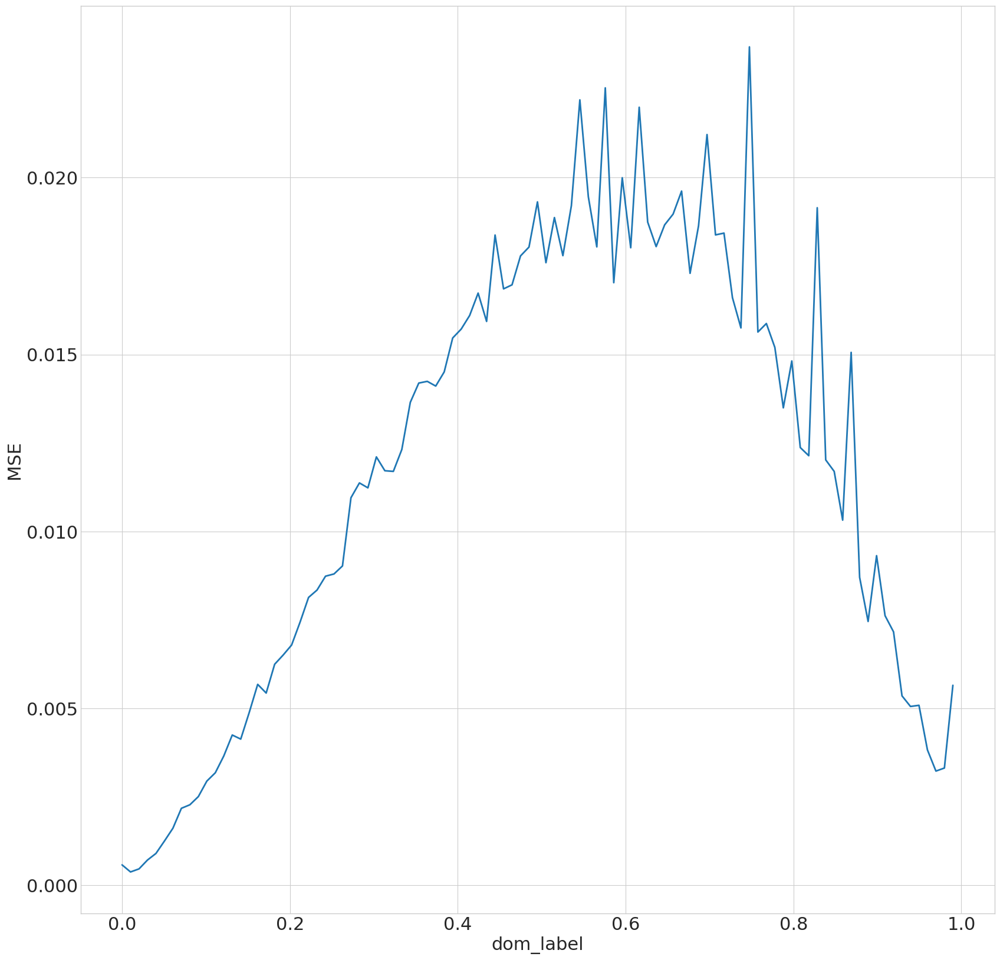

In [29]:
## Plot MSE across dom_label from 0 to 1

m6a_df = logsum_df2[logsum_df2["dom_threshold"]].copy()
mse = []
for i in np.linspace(0, 1, 100):
    ## select dom_label within bin
    selected_df = m6a_df[(m6a_df["dom_label"] > i) & (m6a_df["dom_label"] < i+0.01)]
    mse.append(np.mean((selected_df["dom"] - selected_df["dom_label"])**2))

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.plot(np.linspace(0, 1, 100), mse)
ax.set_xlabel("dom_label")
ax.set_ylabel("MSE")
plt.show()

In [196]:
values = m6a_df[m6a_df["dom_label"]>0].sample(10000)[["dom", "dom_label"]].values
kernel = stats.gaussian_kde(values.T, bw_method=0.2)
values = m6a_df[["dom", "dom_label"]].values
kernel = kernel(values.T)

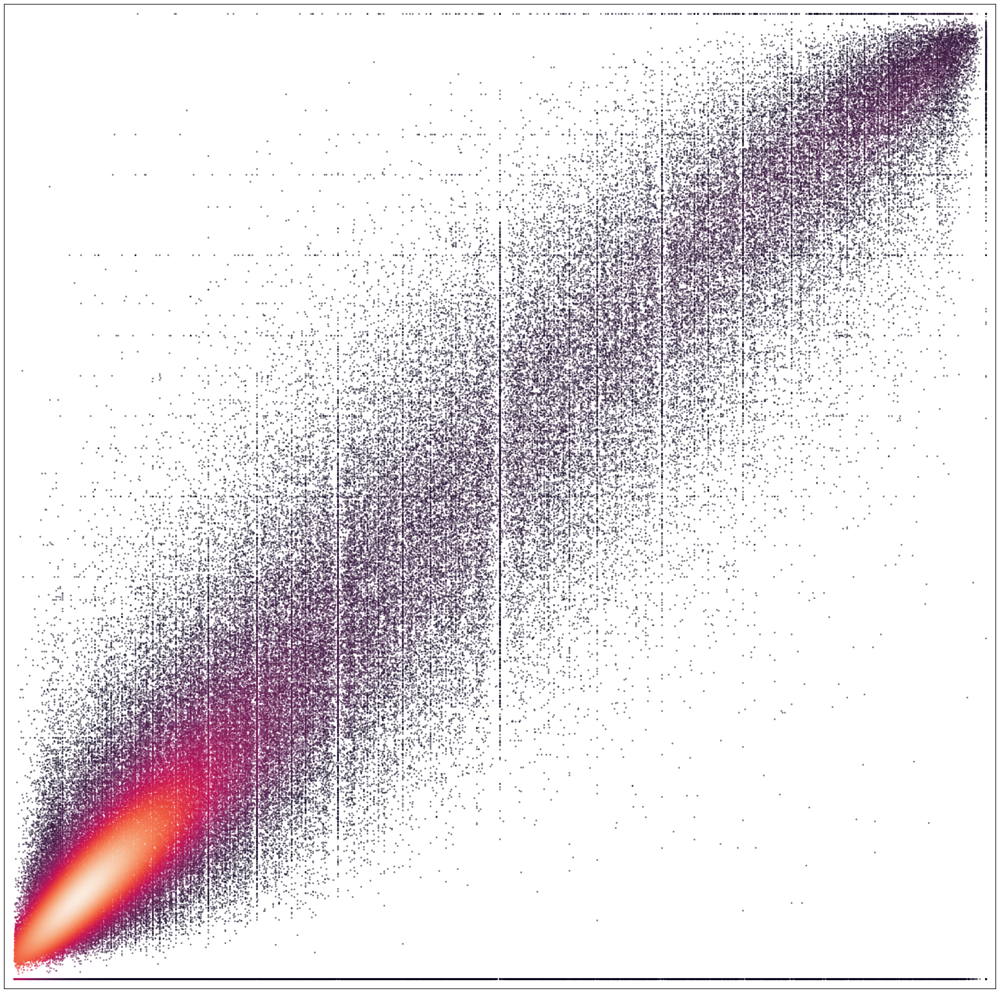

R2 0.79568042520645


In [197]:
import matplotlib.colors as mcolors
plt.style.use('default')
plt.style.use('seaborn-v0_8-white')
plt.rcParams.update({'font.size': 22, 'legend.facecolor': 'white', 'legend.framealpha': 1, "legend.frameon": 1, "lines.linewidth": 2})
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
sns.scatterplot(data=m6a_df, x="dom", y="dom_label", ax=ax, c=kernel, cmap=sns.color_palette("rocket", as_cmap=True), s=10, legend=False, linewidth=0, alpha = 0.5)
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/airna_dom_scatter.png", format="png")
plt.show()
print("R2", stats.pearsonr(m6a_df["dom"], m6a_df["dom_label"])[0]**2)

In [34]:
dorado_df = dorado_alt.merge(label_df, on="label_id", how="inner")


In [39]:
m6a_df = dorado_df[(dorado_df["pred_dorado"] > 0.0)].copy()
print(len(m6a_df))
print("R2", stats.pearsonr(m6a_df["pred_dorado"], m6a_df["dom_label"])[0]**2)
print("Rho2", stats.spearmanr(m6a_df["pred_dorado"], m6a_df["dom_label"])[0]**2)

9516318
R2 0.44981092289344243
Rho2 0.02097110824809751


In [41]:
m6a_df = dorado_df[(dorado_df["pred_dorado"] > 0.0) & (dorado_df["dom_label"] < 0.1)].copy()
print("MSE", np.mean((m6a_df["pred_dorado"] - m6a_df["dom_label"])**2))

MSE 0.005942061768139149


In [189]:
values = m6a_df[m6a_df["dom_label"]>0].sample(1000)[["pred_dorado", "dom_label"]].values
kernel = stats.gaussian_kde(values.T)
values = m6a_df[["pred_dorado", "dom_label"]].values
kernel = kernel(values.T)

In [37]:
dorado_m6a_df = dorado_df[(dorado_df["pred_dorado"] > 0.0)].copy()
print(len(dorado_m6a_df))
print("R2", stats.pearsonr(dorado_m6a_df["pred_dorado"], dorado_m6a_df["dom_label"])[0]**2)
print("Rho2", stats.spearmanr(dorado_m6a_df["pred_dorado"], dorado_m6a_df["dom_label"])[0]**2)

9516318
R2 0.44981092289344243
Rho2 0.02097110824809751


In [ ]:
dorado_values = dorado_m6a_df[dorado_m6a_df["dom_label"]>0].sample(1000)[["pred_dorado", "dom_label"]].values
dorado_kernel = stats.gaussian_kde(dorado_values.T)
dorado_values = dorado_m6a_df[["pred_dorado", "dom_label"]].values
dorado_kernel = dorado_kernel(dorado_values.T)

In [200]:
dorado_kernel = dorado_kernel(dorado_values.T)

In [ ]:

plt.style.use('default')
plt.style.use('seaborn-v0_8-white')
plt.rcParams.update({'font.size': 22, 'legend.facecolor': 'white', 'legend.framealpha': 1, "legend.frameon": 1, "lines.linewidth": 2})
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
sns.scatterplot(data=dorado_m6a_df, x="pred_dorado", y="dom_label", ax=ax, c=dorado_kernel, cmap=sns.color_palette("rocket", as_cmap=True), s=10, legend=False, linewidth=0, alpha = 0.5)
ax.set_xlim(-0.01, 1.01)
ax.set_ylim(-0.01, 1.01)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/dorado_dom_scatter_2.png", format="png")
plt.show()
print("R2", stats.pearsonr(dorado_m6a_df["pred_dorado"], dorado_m6a_df["dom_label"])[0]**2)

In [47]:
m6anet_df2 = m6anet_df.merge(label_df, on="label_id", how="inner")

In [48]:
m6anet_m6a_df = m6anet_df2[(m6anet_df2["pred_m6anet"] > 0.0)].copy()
print(len(m6anet_m6a_df))
print("R2", stats.pearsonr(m6anet_m6a_df["dom_m6anet"], m6anet_m6a_df["dom_label"])[0]**2)
print("Rho2", stats.spearmanr(m6anet_m6a_df["dom_m6anet"], m6anet_m6a_df["dom_label"])[0]**2)

473585


NameError: name 'stats' is not defined

In [206]:
m6anet_values = m6anet_m6a_df[m6anet_m6a_df["dom_label"]>0].sample(1000)[["dom_m6anet", "dom_label"]].values
m6anet_kernel = stats.gaussian_kde(m6anet_values.T)
m6anet_values = m6anet_m6a_df[["dom_m6anet", "dom_label"]].values
m6anet_kernel = m6anet_kernel(m6anet_values.T)

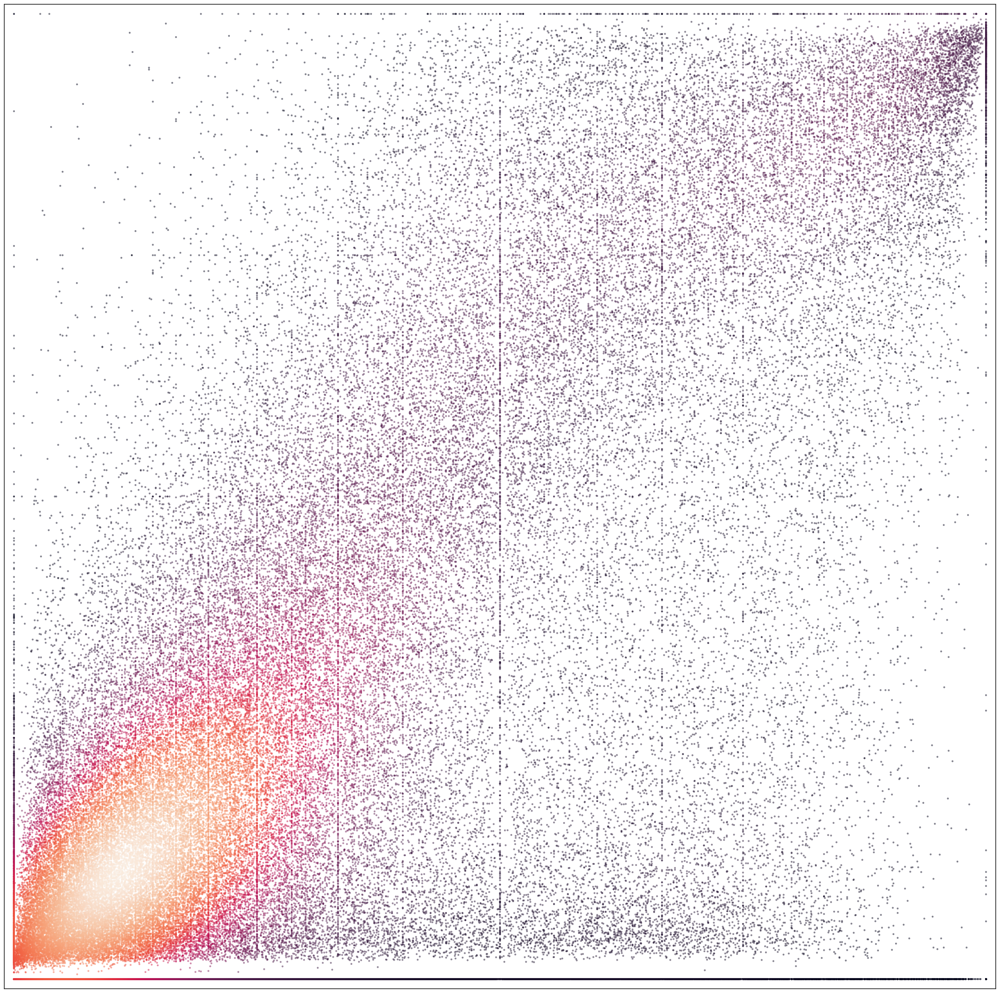

R2 0.4771757217337522


In [208]:

plt.style.use('default')
plt.style.use('seaborn-v0_8-white')
plt.rcParams.update({'font.size': 22, 'legend.facecolor': 'white', 'legend.framealpha': 1, "legend.frameon": 1, "lines.linewidth": 2})
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
sns.scatterplot(data=m6anet_m6a_df, x="dom_m6anet", y="dom_label", ax=ax, c=m6anet_kernel, cmap=sns.color_palette("rocket", as_cmap=True), s=10, legend=False, linewidth=0, alpha = 0.5)
ax.set_xlim(-0.01, 1.01)
ax.set_ylim(-0.01, 1.01)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("/extdata4/baeklab/Hyeonseo/m6A/poster/m6anet_dom_scatter_2.png", format="png")
plt.show()
print("R2", stats.pearsonr(m6anet_m6a_df["dom_m6anet"], m6anet_m6a_df["dom_label"])[0]**2)

In [5]:
m6a_df = logsum_df[logsum_df["pm6a"] > threshold]
print(m6a_df)

KeyError: 'pm6a'

In [ ]:
metagene_df= m6a_df[["label_id","dom"]].copy()

In [ ]:
from Bio import SeqIO
ref_path = "/extdata4/baeklab/Hyeonseo/m6A/res/ref/isoform/hg38_rna_nrnm.fasta"
fasta_dict = SeqIO.to_dict(SeqIO.parse(ref_path, "fasta"))
fasta_dict = {x.split(".")[0]: y for x, y in fasta_dict.items()}

metagene_df["pos"] = metagene_df["label_id"].str.split(":").str[1].astype(np.int32)
metagene_df["refseq"] = metagene_df["label_id"].str.split(":").str[0]
metagene_df["tlen"] = metagene_df["refseq"].map(lambda x: len(fasta_dict[x]))
metagene_df

In [ ]:
sys.path.append("/extdata4/baeklab/Hyeonseo/m6A/modformer")
from utils.utils import parse_refflat
refflat_df = parse_refflat()

In [1]:
print(refflat_df)

NameError: name 'refflat_df' is not defined